# Figure 1: Assessment of the new method: cerebellum-specific ALE (C-SALE).

### Author: Neville Magielse
### Date: 05.08.2024

In [1]:
import os
import sys

# User-specified base working directory
BASE_DIR = '/data/project/cerebellum_ale/'  # Change this to your project folder. Make sure they have input and output folders.

# Defines input and output paths.
INPUT_DIR = os.path.join(BASE_DIR, 'input')
OUTPUT_DIR = os.path.join(BASE_DIR, 'output')

sys.path.append(os.path.join(BASE_DIR, 'scripts'))

In [2]:
import nimare
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import nilearn.plotting, nilearn.maskers, nilearn.image
import nilearn.surface
import nibabel
from pprint import pprint
import itertools
import scipy
import scipy.spatial
from tqdm import tqdm

import nimare_gpu
import SUITPy.flatmap

import scipy.cluster.hierarchy as sch

# plt.rcParams['text.usetex'] = False

In [3]:
dsets = {}
domains = ['action', 'cognition', 'emotion', 'perception', 'interoception']
for direction in ['pos', 'neg']:
    dsets[direction] = {}
    for domain in domains:
        dsets[direction][domain] = nimare.io.convert_sleuth_to_dataset(os.path.join(INPUT_DIR, "sleuth", f"{direction}_bd-{domain}.txt"), target="mni152_2mm")

In [4]:
xyz = []
for i, (direction, domain) in enumerate(itertools.product(['pos'], domains)): # Removed negative here, to only focus on activations
    xyz.append(dsets[direction][domain].coordinates[['x', 'y','z']].values)
xyz = np.concatenate(xyz, axis=0)

In [5]:
xyz.shape # use any example to check

(58274, 3)

In [6]:
# remove duplicates
xyz = np.unique(xyz, axis=0)
xyz.shape

(37754, 3)

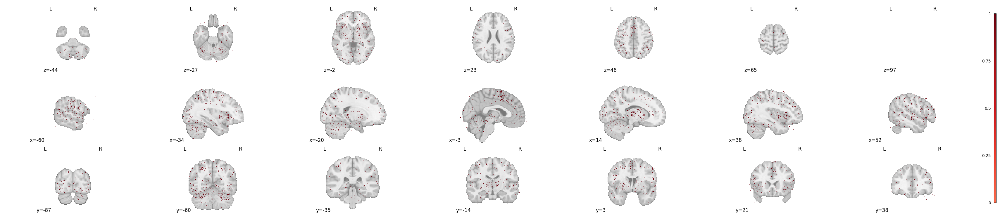

In [7]:
mni_temp = nilearn.datasets.load_mni152_template(resolution=1)
foci_voxels = nibabel.affines.apply_affine(np.linalg.inv(mni_temp.affine), xyz).astype('int')
foci_img_data = np.zeros(mni_temp.shape)
foci_img_data[foci_voxels[:,0], foci_voxels[:, 1], foci_voxels[:, 2]] = 1
foci_img = nilearn.image.new_img_like(mni_temp, foci_img_data)
nilearn.plotting.plot_stat_map(
    foci_img, 
    threshold=0, display_mode='mosaic',
    cmap='Reds'
) # Notice many extra-cerebellar coordinates, that we want to remove before making this Figure.

## Limit xyz to the cerebellum

###  First, In voxel space

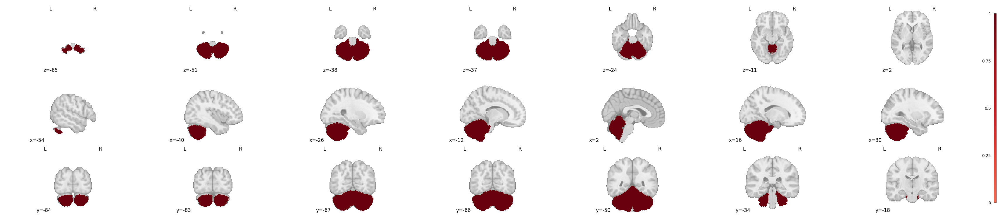

In [8]:
cerebellum_mask_1mm = nibabel.load(os.path.join(INPUT_DIR, 'maps', 'cerebellumMask_1mm.nii.gz'))
cerebellum_mask_1mm_mni = nilearn.image.resample_to_img(cerebellum_mask_1mm, mni_temp, interpolation='nearest')
nilearn.plotting.plot_stat_map(
    cerebellum_mask_1mm_mni, 
    threshold=0, display_mode='mosaic',
    cmap='Reds'
)

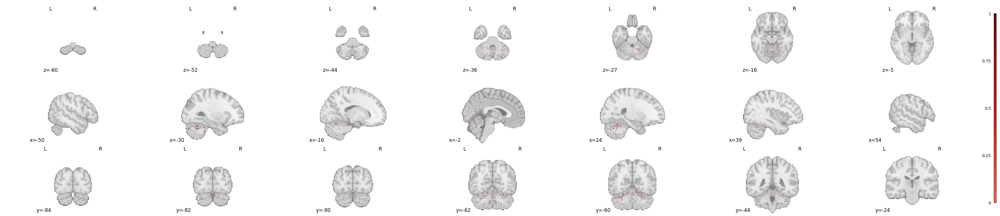

In [9]:
foci_img_data[~(cerebellum_mask_1mm_mni.get_fdata().astype('bool'))] = 0
foci_img = nilearn.image.new_img_like(mni_temp, foci_img_data)
nilearn.plotting.plot_stat_map(
    foci_img, 
    threshold=0, display_mode='mosaic',
    cmap='Reds'
)
# Verify (visually) that coordinates are restricted to the cerebellar ROI!

In [10]:
ijk_cerebellum = np.vstack(np.where(foci_img_data>0)).T
xyz_cerebellum = nibabel.affines.apply_affine(mni_temp.affine, ijk_cerebellum)
print(xyz_cerebellum.shape)
xyz_cerebellum

(3645, 3)


array([[-50., -70., -30.],
       [-50., -58., -36.],
       [-49., -70., -29.],
       ...,
       [ 52., -50., -42.],
       [ 54., -64., -32.],
       [ 54., -61., -34.]])

## To conserve the actual coordinates in world space (MNI)

In [11]:
# get MNI coordinates of all cerebellum voxels (2mm space to reduce computational costs)
cerebellum_mask_2mm = nibabel.load(os.path.join(INPUT_DIR, 'maps', 'cerebellumMask.nii.gz'))
mask_ijk = np.vstack(np.where(cerebellum_mask_2mm.get_fdata() > 0)).T
mask_xyz = nibabel.affines.apply_affine(cerebellum_mask_2mm.affine, mask_ijk)
mask_xyz

array([[ 56., -62., -38.],
       [ 56., -62., -36.],
       [ 56., -60., -40.],
       ...,
       [-54., -48., -42.],
       [-54., -46., -44.],
       [-54., -46., -42.]])

In [12]:
xyz_cerebellum_2 = []
# get points with a min distance of < 2mm from all cerebellar voxels
# not using scipy.spatial.distance_matrix to avoid using a lot of memory
for curr_point in tqdm(xyz): 
    curr_dist = np.linalg.norm(np.array(curr_point)[np.newaxis, :] - mask_xyz, axis=1)
    if curr_dist.min() <= 2:
        xyz_cerebellum_2.append(curr_point)
xyz_cerebellum_2 = np.array(xyz_cerebellum_2)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37754/37754 [00:50<00:00, 749.49it/s]


In [13]:
xyz_cerebellum_2.shape # Check shape of the coordinate array.

(3957, 3)

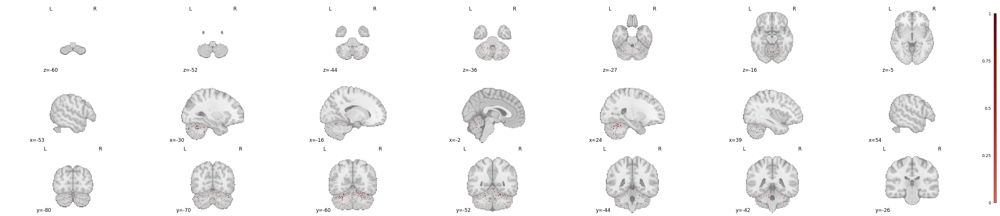

In [17]:
# Check if coordinates were correctly restricted to the cerebellum. This map shows a strong superior bias.
foci_voxels = nibabel.affines.apply_affine(np.linalg.inv(mni_temp.affine), xyz_cerebellum_2).astype('int')
foci_img_data = np.zeros(mni_temp.shape)
foci_img_data[foci_voxels[:,0], foci_voxels[:, 1], foci_voxels[:, 2]] = 1
foci_img = nilearn.image.new_img_like(mni_temp, foci_img_data)
nilearn.plotting.plot_stat_map(
    foci_img, 
    threshold=0, display_mode='mosaic',
    cmap='Reds'
) # Extra-cerebellar coordinates should be gone!

# Plot the number of coordinates/ foci and voxels as factor of location along the z-axis

In [18]:
print(xyz_cerebellum_2)
print(mask_xyz)

[[-52.36 -60.77 -29.6 ]
 [-51.   -54.81 -29.67]
 [-50.   -70.   -30.  ]
 ...
 [ 54.48 -60.3  -33.09]
 [ 54.5  -63.38 -31.72]
 [ 56.   -50.   -38.  ]]
[[ 56. -62. -38.]
 [ 56. -62. -36.]
 [ 56. -60. -40.]
 ...
 [-54. -48. -42.]
 [-54. -46. -44.]
 [-54. -46. -42.]]


In [19]:
print(xyz_cerebellum_2[:, 2])  # Should print the z-coordinates of xyz_cerebellum_2
print(mask_xyz[:, 2])          # Should print the z-coordinates of mask_xyz

[-29.6  -29.67 -30.   ... -33.09 -31.72 -38.  ]
[-38. -36. -40. ... -42. -44. -42.]


# Create Figure 1A

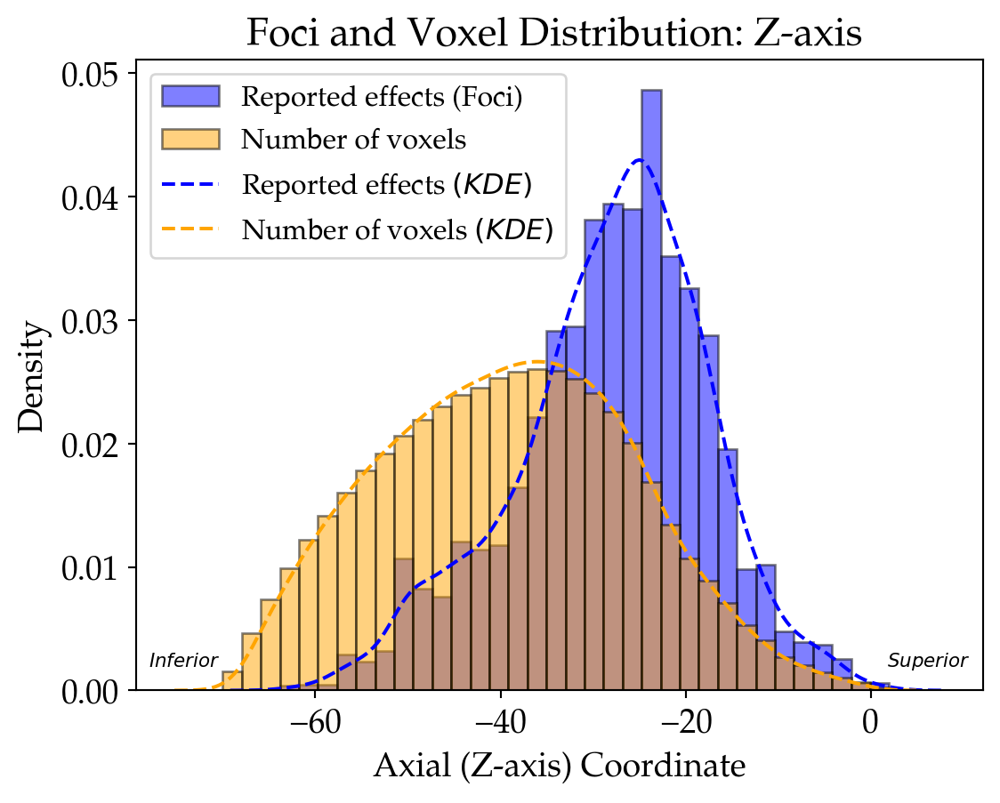

In [20]:
# Set up font style
plt.rcParams["font.family"] = "Asana Math"
plt.rcParams["font.size"] = 14
plt.rcParams["figure.dpi"] = 192

# Determine bins for the histograms based on both foci and voxels
bins = np.histogram_bin_edges(np.concatenate([xyz_cerebellum_2[:, 2], mask_xyz[:, 2]]), bins=35)

# Plot the histogram for the reported effects
plt.hist(xyz_cerebellum_2[:, 2], bins=bins, density=True, alpha=0.5, label='Reported effects (Foci)', color='blue', edgecolor='black')

# Plot the histogram for the number of voxels
plt.hist(mask_xyz[:, 2], bins=bins, density=True, alpha=0.5, label='Number of voxels', color='orange', edgecolor='black')

# Optionally, add KDE for smoothed distribution
sns.kdeplot(xyz_cerebellum_2[:, 2], color='blue', label='Reported effects $\mathit{(KDE)}$', linestyle='--')
sns.kdeplot(mask_xyz[:, 2], color='orange', label='Number of voxels $\mathit{(KDE)}$', linestyle='--')

# Add legend and labels
plt.legend(fontsize=12, loc='upper left', bbox_to_anchor=(0.0, 1))
plt.xlabel('Axial (Z-axis) Coordinate')
plt.ylabel('Density')
plt.title('Foci and Voxel Distribution: Z-axis ')

# Add manual labels on the bottom left and right corners with offset
x_offset = 0.015 * (plt.xlim()[1] - plt.xlim()[0])
y_offset = 0.03 * (plt.ylim()[1] - plt.ylim()[0])

plt.text(x=plt.xlim()[0] + x_offset, y=plt.ylim()[0] + y_offset, 
         s='$\mathit{Inferior}$', ha='left', va='bottom', fontsize=8)
plt.text(x=plt.xlim()[1] - x_offset, y=plt.ylim()[0] + y_offset, 
         s='$\mathit{Superior}$', ha='right', va='bottom', fontsize=8)

# Save the figure
plt.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure1/1a_Foci_voxel_Distributions_z-axis.png'), bbox_inches='tight')

# Show the plot
plt.show()


# Do the same for the Y-axis (coronal plane; anterior-posterior)

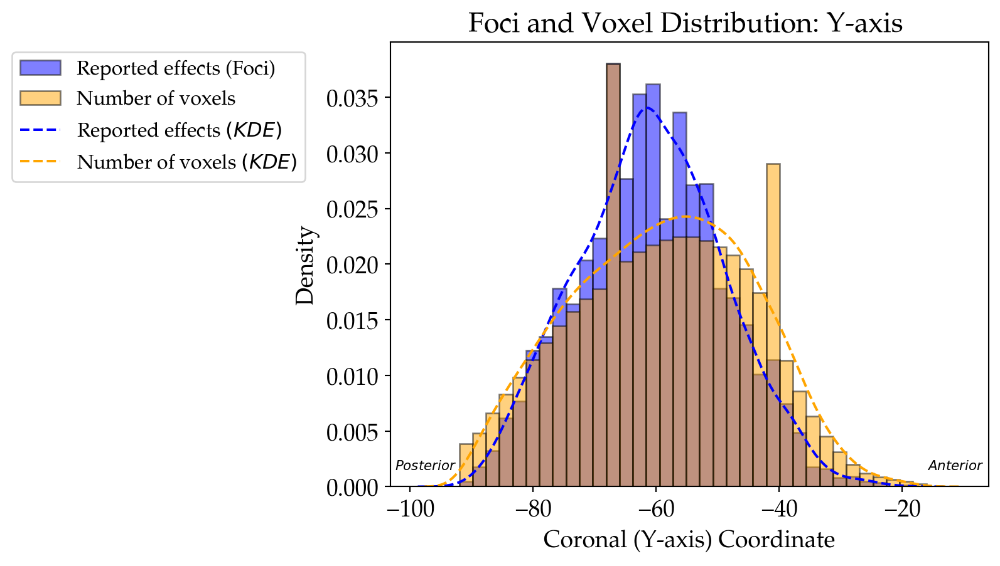

In [21]:
# Set up font style
plt.rcParams["font.family"] = "Asana Math"
plt.rcParams["font.size"] = 14
plt.rcParams["figure.dpi"] = 192

# Determine bins for the histograms based on both foci and voxels
bins = np.histogram_bin_edges(np.concatenate([xyz_cerebellum_2[:, 1], mask_xyz[:, 1]]), bins=35)

# Plot the histogram for the reported effects
plt.hist(xyz_cerebellum_2[:, 1], bins=bins, density=True, alpha=0.5, label='Reported effects (Foci)', color='blue', edgecolor='black')

# Plot the histogram for the number of voxels
plt.hist(mask_xyz[:, 1], bins=bins, density=True, alpha=0.5, label='Number of voxels', color='orange', edgecolor='black')

# Optionally, add KDE for smoothed distribution
sns.kdeplot(xyz_cerebellum_2[:, 1], color='blue', label='Reported effects $\mathit{(KDE)}$', linestyle='--')
sns.kdeplot(mask_xyz[:, 1], color='orange', label='Number of voxels $\mathit{(KDE)}$', linestyle='--')

# Add legend and labels
plt.legend(fontsize=12, loc='upper left', bbox_to_anchor=(-0.65, 1))
plt.xlabel('Coronal (Y-axis) Coordinate')
plt.ylabel('Density')
plt.title('Foci and Voxel Distribution: Y-axis ')

# Add manual labels on the bottom left and right corners with offset
x_offset = 0.007 * (plt.xlim()[1] - plt.xlim()[0])
y_offset = 0.03 * (plt.ylim()[1] - plt.ylim()[0])

plt.text(x=plt.xlim()[0] + x_offset, y=plt.ylim()[0] + y_offset, 
         s='$\mathit{Posterior}$', ha='left', va='bottom', fontsize=8)
plt.text(x=plt.xlim()[1] - x_offset, y=plt.ylim()[0] + y_offset, 
         s='$\mathit{Anterior}$', ha='right', va='bottom', fontsize=8)

# Save the figure
plt.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure1/Supplementary/Foci_voxel_Distributions_y-axis.png'), bbox_inches='tight')

# Show the plot
plt.show()


# X-axis (Left to right)

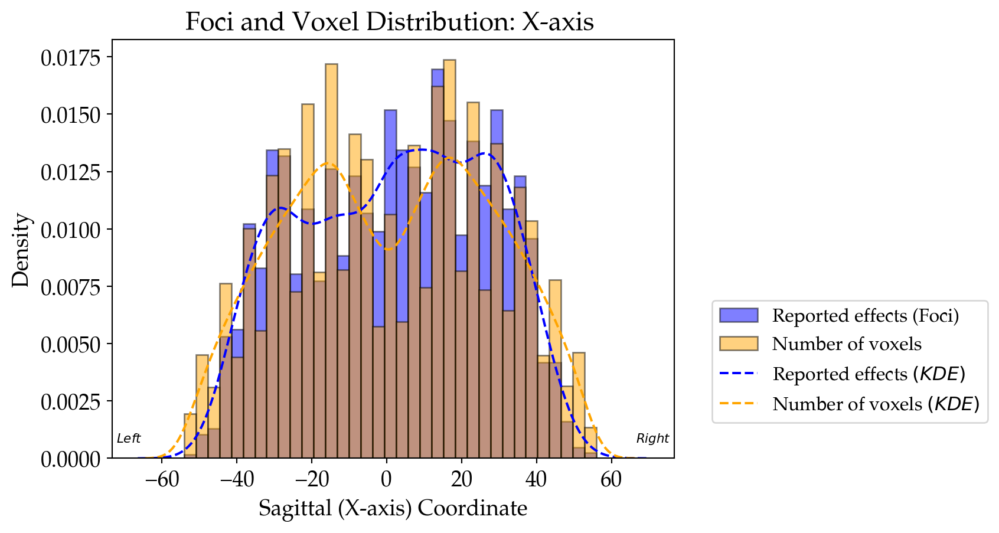

In [22]:
# Set up font style
plt.rcParams["font.family"] = "Asana Math"
plt.rcParams["font.size"] = 14
plt.rcParams["figure.dpi"] = 192

# Determine bins for the histograms based on both foci and voxels
bins = np.histogram_bin_edges(np.concatenate([xyz_cerebellum_2[:, 0], mask_xyz[:, 0]]), bins=35)

# Plot the histogram for the reported effects
plt.hist(xyz_cerebellum_2[:, 0], bins=bins, density=True, alpha=0.5, label='Reported effects (Foci)', color='blue', edgecolor='black')

# Plot the histogram for the number of voxels
plt.hist(mask_xyz[:, 0], bins=bins, density=True, alpha=0.5, label='Number of voxels', color='orange', edgecolor='black')

# Optionally, add KDE for smoothed distribution
sns.kdeplot(xyz_cerebellum_2[:, 0], color='blue', label='Reported effects $\mathit{(KDE)}$', linestyle='--')
sns.kdeplot(mask_xyz[:, 0], color='orange', label='Number of voxels $\mathit{(KDE)}$', linestyle='--')

# Add legend and labels
plt.legend(fontsize=12, loc='upper left', bbox_to_anchor=(1.05, 0.4))
plt.xlabel('Sagittal (X-axis) Coordinate')
plt.ylabel('Density')
plt.title('Foci and Voxel Distribution: X-axis ')

# Add manual labels on the bottom left and right corners with offset
x_offset = 0.007 * (plt.xlim()[1] - plt.xlim()[0])
y_offset = 0.03 * (plt.ylim()[1] - plt.ylim()[0])

plt.text(x=plt.xlim()[0] + x_offset, y=plt.ylim()[0] + y_offset, 
         s='$\mathit{Left}$', ha='left', va='bottom', fontsize=8)
plt.text(x=plt.xlim()[1] - x_offset, y=plt.ylim()[0] + y_offset, 
         s='$\mathit{Right}$', ha='right', va='bottom', fontsize=8)

# Save the figure
plt.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure1/Supplementary/Foci_voxel_Distributions_x-axis.png'), bbox_inches='tight')

# Show the plot
plt.show()

# Do it for all domains seperately.

Action Domain: (1195, 3)
Cognition Domain: (2103, 3)
Emotion Domain: (447, 3)
Perception Domain: (1143, 3)
Interoception Domain: (245, 3)


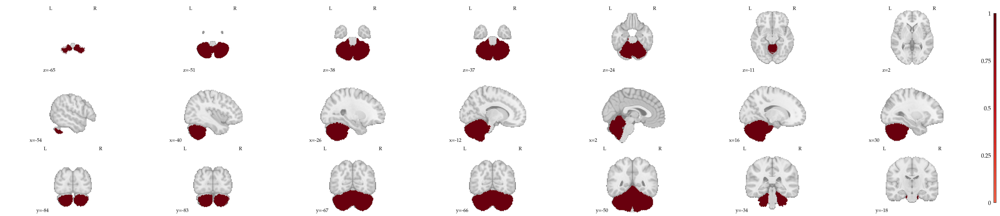

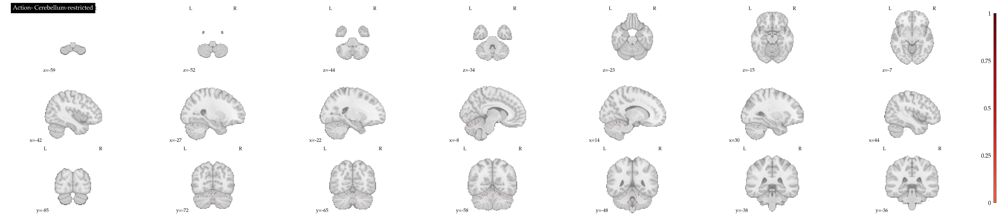

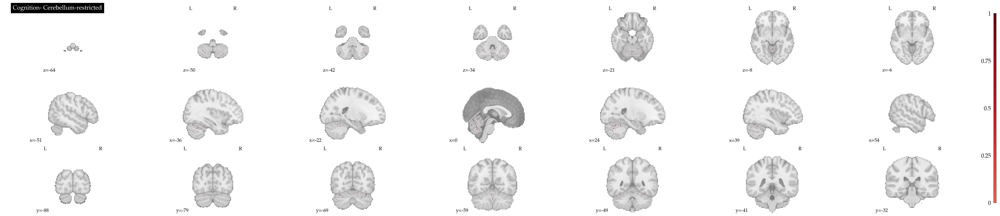

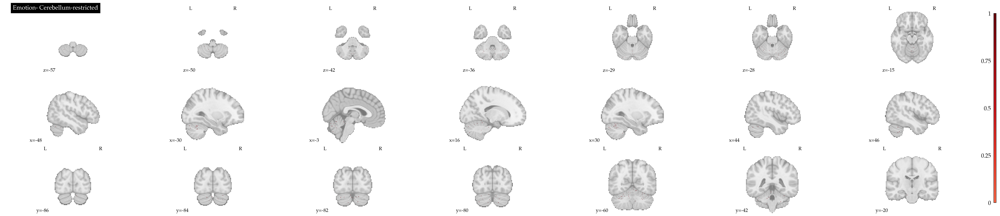

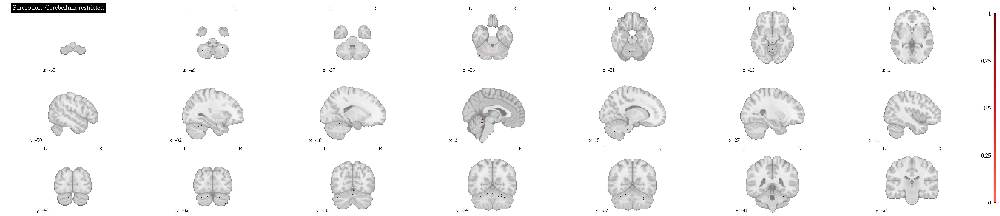

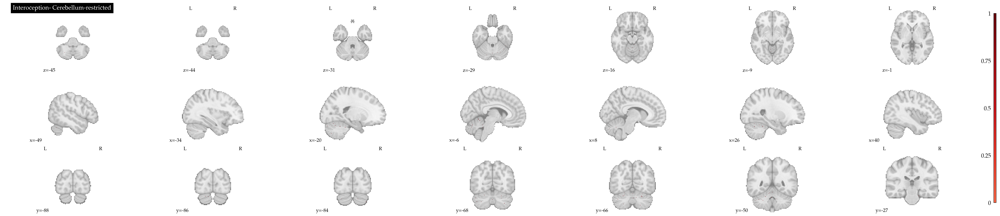

In [23]:
# Initialize the dsets dictionary
dsets = {}
domains = ['action', 'cognition', 'emotion', 'perception', 'interoception']
for direction in ['pos', 'neg']:
    dsets[direction] = {}
    for domain in domains:
        dsets[direction][domain] = nimare.io.convert_sleuth_to_dataset(os.path.join(INPUT_DIR, "sleuth", f"{direction}_bd-{domain}.txt"), target="mni152_2mm")

# Initialize the xyz_dict dictionary and keep unique coordinates for each domain
xyz_dict = {}
for domain in domains:
    xyz = []
    for direction in ['pos']: # Remove neg, because we do not focus on deactivations.
        xyz.append(dsets[direction][domain].coordinates[['x', 'y', 'z']].values)
    xyz_combined = np.concatenate(xyz, axis=0)
    xyz_unique = np.unique(xyz_combined, axis=0)
    xyz_dict[domain] = xyz_unique

# Load the MNI template
mni_temp = nilearn.datasets.load_mni152_template(resolution=1)

# Load and resample the cerebellar mask to match the MNI template
cerebellum_mask_1mm = nibabel.load(os.path.join(INPUT_DIR, 'maps', 'cerebellumMask_1mm.nii.gz'))
cerebellum_mask_1mm_mni = nilearn.image.resample_to_img(cerebellum_mask_1mm, mni_temp, interpolation='nearest')

# Plot the cerebellar mask to verify it
nilearn.plotting.plot_stat_map(
    cerebellum_mask_1mm_mni, 
    threshold=0, display_mode='mosaic',
    cmap='Reds'
)

# Initialize the cerebellum-restricted xyz dictionary
xyz_cerebellum_dict = {}

# Process each domain separately
for domain in domains:
    # Transform the coordinates
    foci_voxels = nibabel.affines.apply_affine(np.linalg.inv(mni_temp.affine), xyz_dict[domain]).astype('int')

    # Create the foci image data
    foci_img_data = np.zeros(mni_temp.shape)
    foci_img_data[foci_voxels[:, 0], foci_voxels[:, 1], foci_voxels[:, 2]] = 1

    # Apply the cerebellar mask
    cerebellum_mask_data = cerebellum_mask_1mm_mni.get_fdata().astype('bool')
    foci_img_data[~cerebellum_mask_data] = 0

    # Find the non-zero voxel indices (restricted to cerebellum)
    ijk_cerebellum = np.vstack(np.where(foci_img_data > 0)).T

    # Transform the voxel indices back to MNI coordinates
    xyz_cerebellum = nibabel.affines.apply_affine(mni_temp.affine, ijk_cerebellum)
    
    # Store the cerebellum-restricted coordinates in the dictionary
    xyz_cerebellum_dict[domain] = xyz_cerebellum

    # Plot the statistical map for the current domain
    foci_img = nilearn.image.new_img_like(mni_temp, foci_img_data)
    nilearn.plotting.plot_stat_map(
        foci_img,
        threshold=0, display_mode='mosaic',
        cmap='Reds',
        title=f'{domain.capitalize()}- Cerebellum-restricted'
    )

# Print the shape of the cerebellum-restricted coordinates for each domain
for domain in domains:
    print(f"{domain.capitalize()} Domain: {xyz_cerebellum_dict[domain].shape}")

# Plot the z-axis bias separately for every behavioral domain

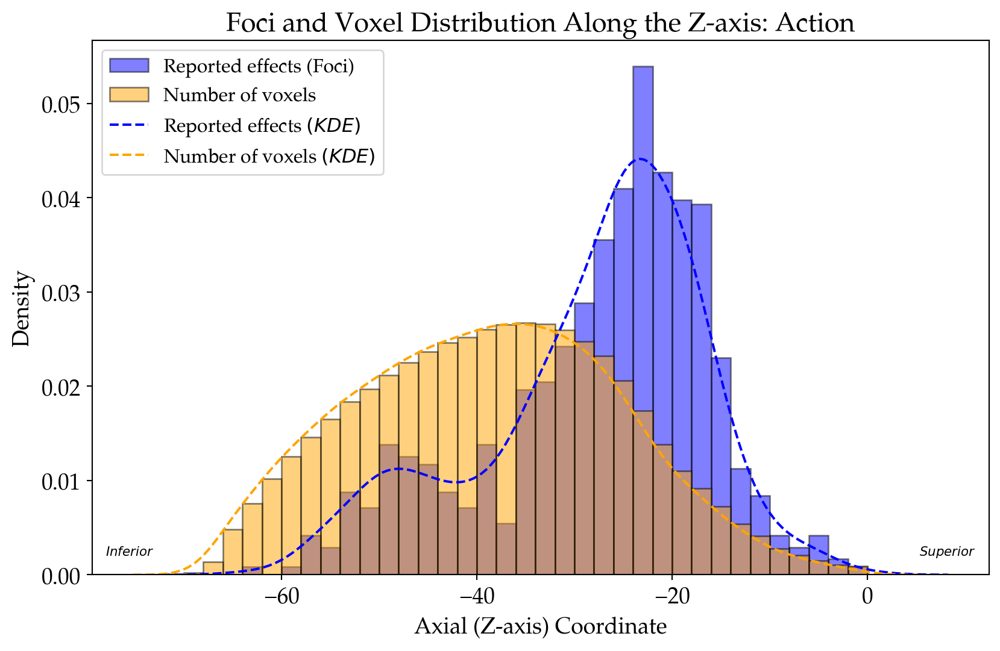

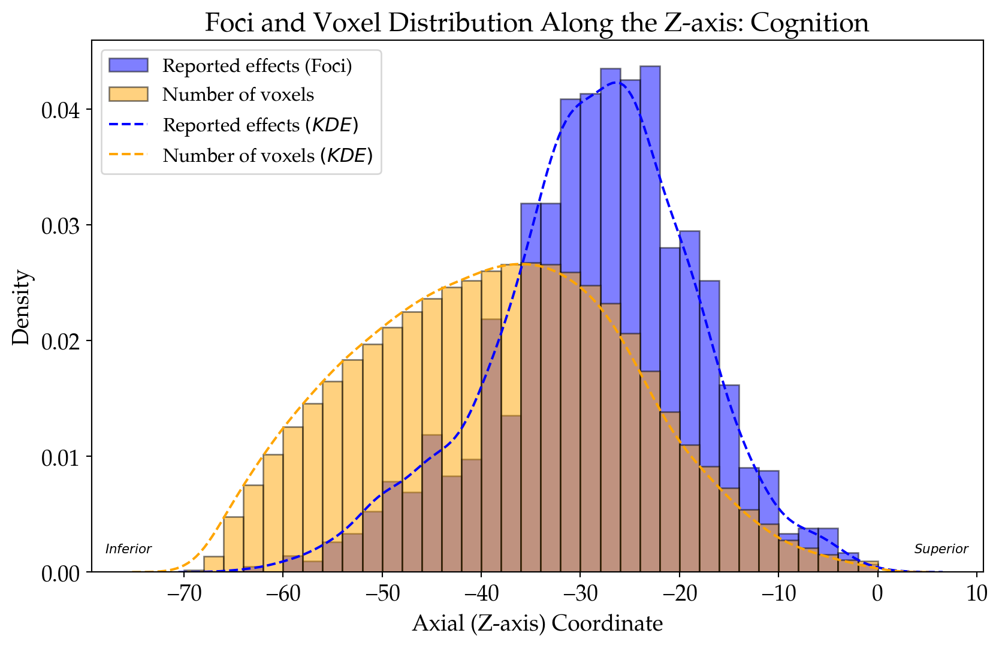

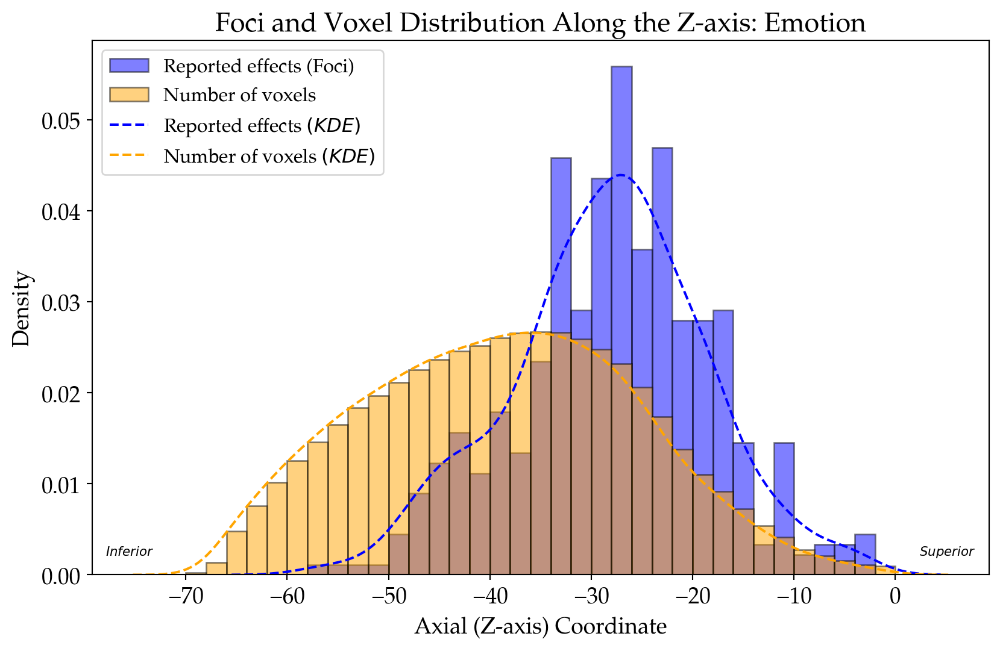

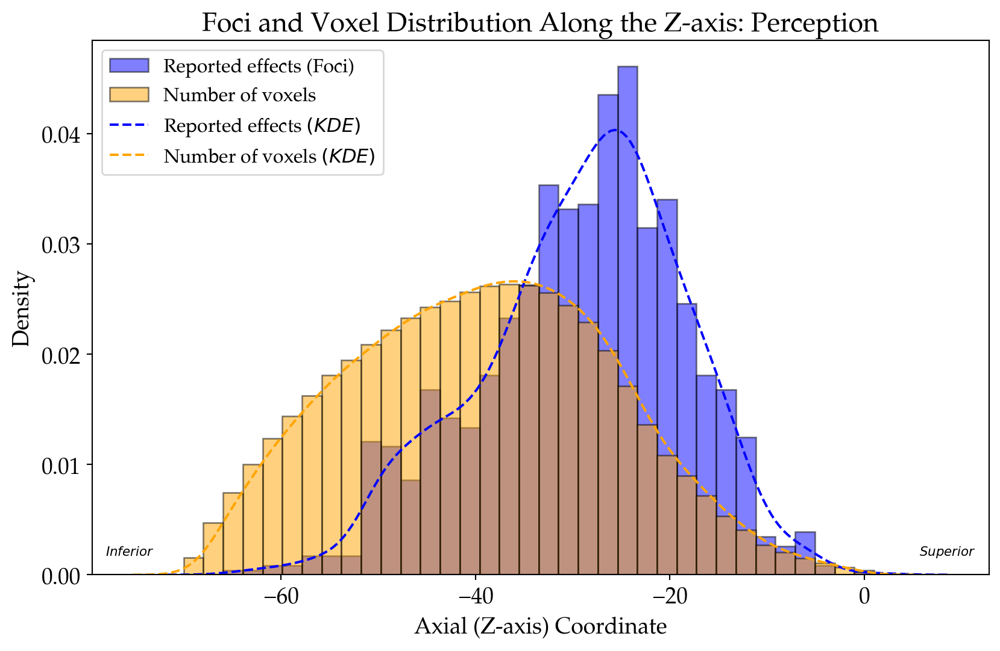

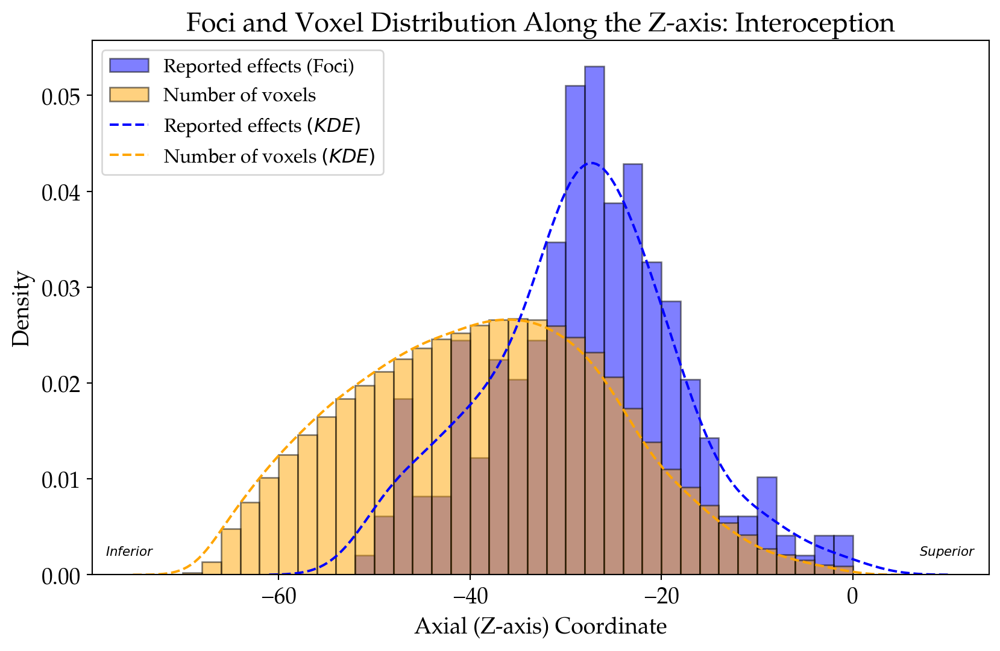

In [24]:
# Set plotting parameters
plt.rcParams["font.family"] = "Asana Math"
plt.rcParams["font.size"] = 14
plt.rcParams["figure.dpi"] = 192

# Define bins using the z-coordinates from all domains and the mask
all_z_coords = np.concatenate([xyz_cerebellum_dict[domain][:, 2] for domain in domains] + [mask_xyz[:, 2]])
bins = np.histogram_bin_edges(all_z_coords, bins=35)



# Plot the histograms for each domain in separate figures
for domain in domains:
    plt.figure(figsize=(10, 6))

    # Determine common bin edges for the histograms
    bins = np.histogram_bin_edges(np.concatenate([xyz_cerebellum_dict[domain][:, 2], mask_xyz[:, 2]]), bins=35)
    
    # Plot the histogram for the reported effects
    plt.hist(xyz_cerebellum_dict[domain][:, 2], bins=bins, density=True, alpha=0.5, label='Reported effects (Foci)', color='blue', edgecolor='black')
    
    # Plot the histogram for the number of voxels
    plt.hist(mask_xyz[:, 2], bins=bins, density=True, alpha=0.5, label='Number of voxels', color='orange', edgecolor='black')
    
    # Optionally, add KDE for smoothed distribution
    sns.kdeplot(xyz_cerebellum_dict[domain][:, 2], color='blue', label='Reported effects $\mathit{(KDE)}$', linestyle='--')
    sns.kdeplot(mask_xyz[:, 2], color='orange', label='Number of voxels $\mathit{(KDE)}$', linestyle='--')
    
    # Add legend and labels
    plt.legend(fontsize = 12, loc='upper left', bbox_to_anchor=(0.0, 1))
    plt.xlabel('Axial (Z-axis) Coordinate')
    plt.ylabel('Density')
    plt.title(f'Foci and Voxel Distribution Along the Z-axis: {domain.capitalize()}')

    # Add manual labels on the bottom left and right corners with offset
    x_offset = 0.015 * (plt.xlim()[1] - plt.xlim()[0])
    y_offset = 0.03 * (plt.ylim()[1] - plt.ylim()[0])
    
    plt.text(x=plt.xlim()[0] + x_offset, y=plt.ylim()[0] + y_offset, 
             s='$\mathit{Inferior}$', ha='left', va='bottom', fontsize=8)
    plt.text(x=plt.xlim()[1] - x_offset, y=plt.ylim()[0] + y_offset, 
             s='$\mathit{Superior}$', ha='right', va='bottom', fontsize=8)

    save_path = os.path.join(BASE_DIR, f'Figures/Publication/Figure1/Supplementary/Foci_voxel_Distributions_{domain}_Z-axis.png') 
    plt.savefig(save_path, bbox_inches = 'tight')
    
    # Show the plot
    # plt.show()


# Do the same for the y-axis

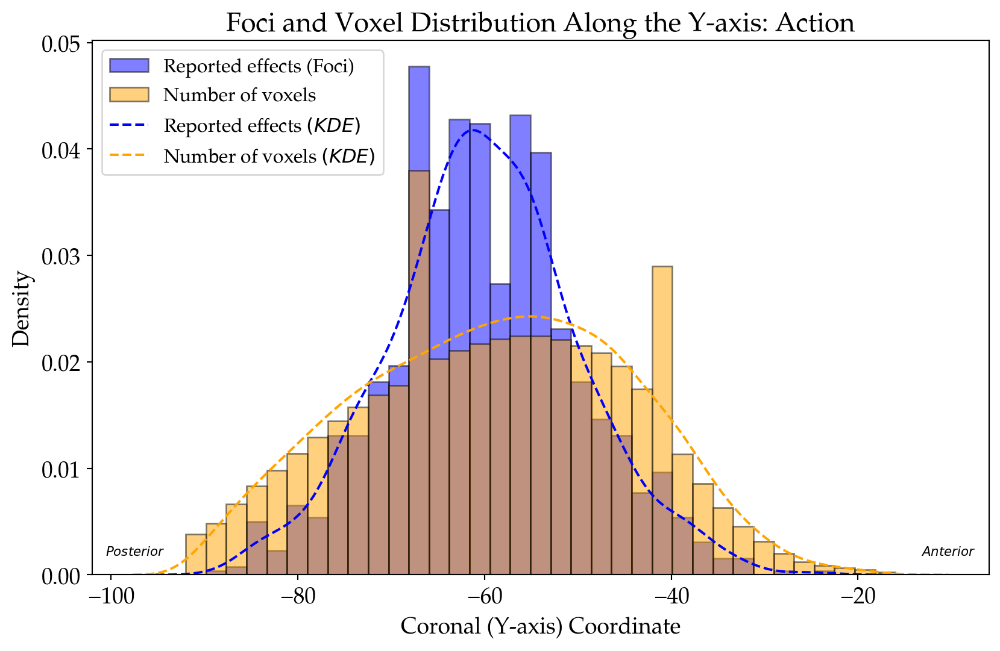

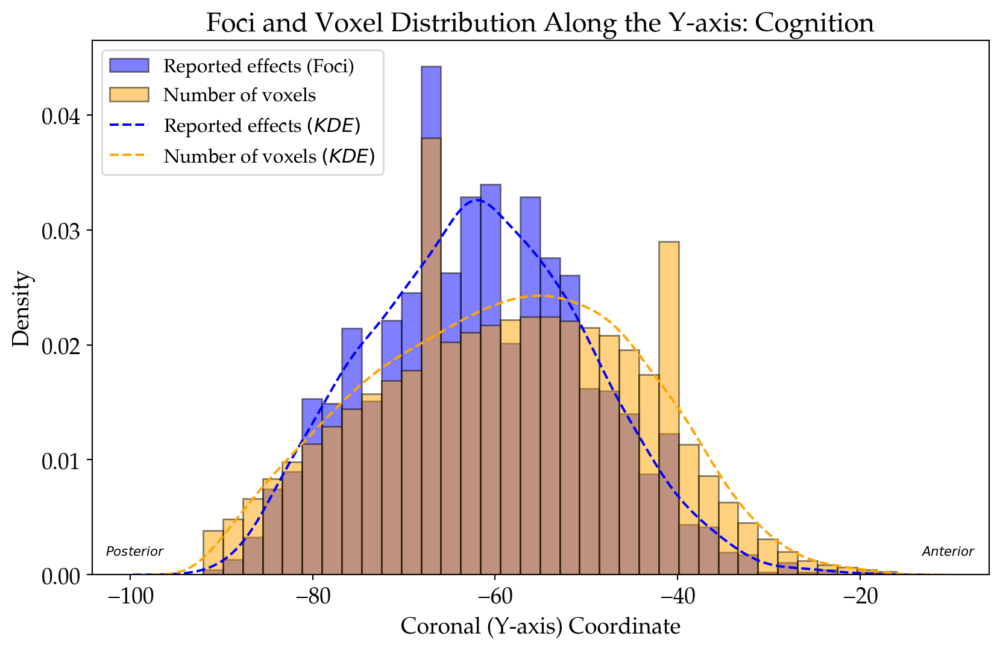

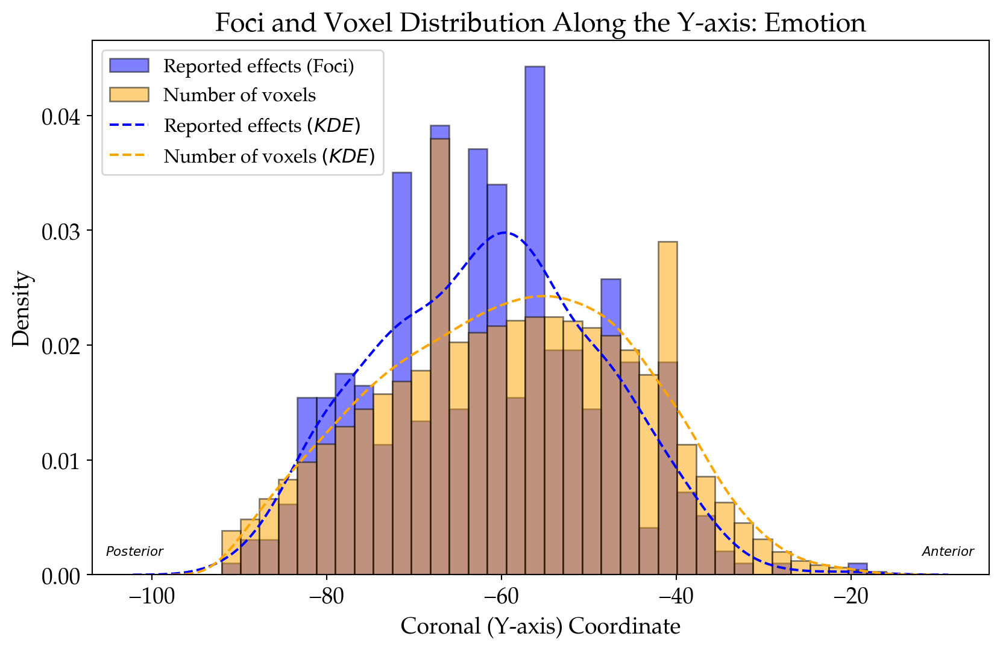

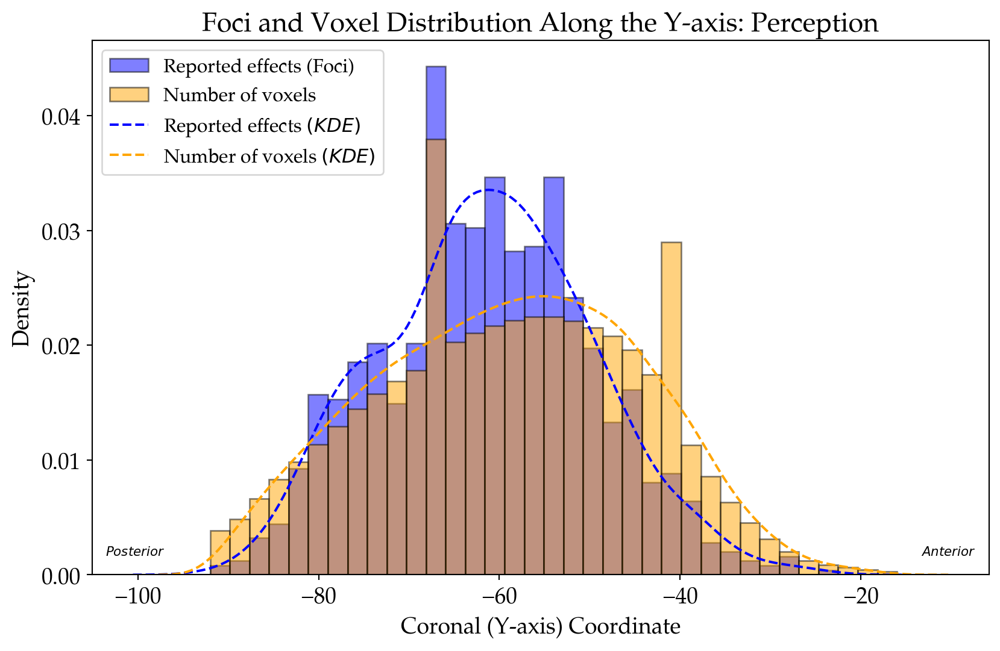

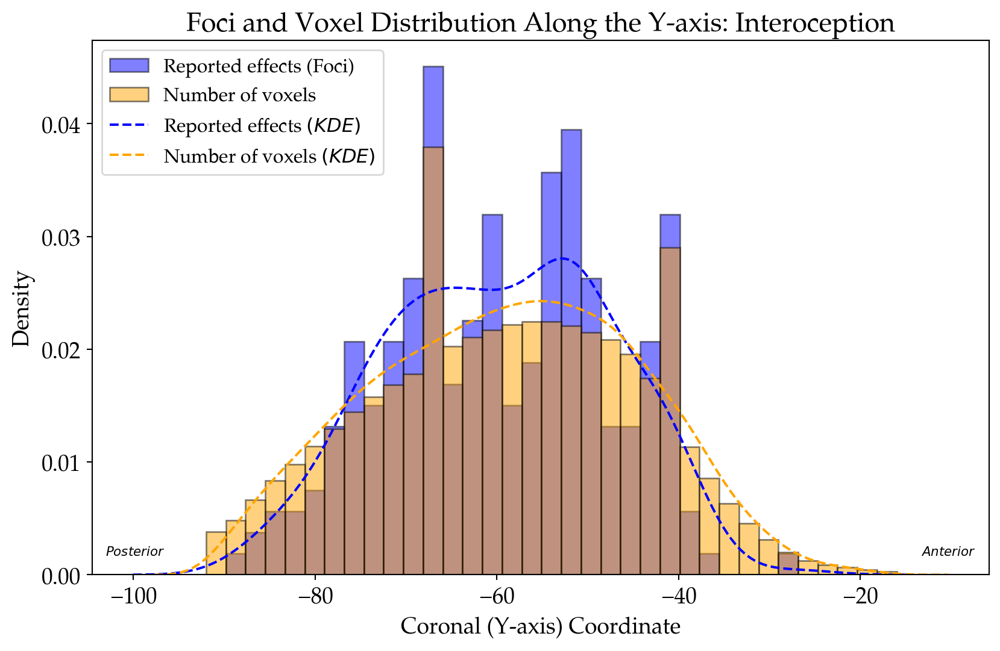

In [25]:
# Set plotting parameters
plt.rcParams["font.family"] = "Asana Math"
plt.rcParams["font.size"] = 14
plt.rcParams["figure.dpi"] = 192

# Define bins using the y-coordinates from all domains and the mask
all_y_coords = np.concatenate([xyz_cerebellum_dict[domain][:, 1] for domain in domains] + [mask_xyz[:, 1]])
bins = np.histogram_bin_edges(all_y_coords, bins=35)

# Plot the histograms for each domain in separate figures
for domain in domains:
    plt.figure(figsize=(10, 6))

    # Determine common bin edges for the histograms
    bins = np.histogram_bin_edges(np.concatenate([xyz_cerebellum_dict[domain][:, 1], mask_xyz[:, 1]]), bins=35)
    
    # Plot the histogram for the reported effects
    plt.hist(xyz_cerebellum_dict[domain][:, 1], bins=bins, density=True, alpha=0.5, label='Reported effects (Foci)', color='blue', edgecolor='black')
    
    # Plot the histogram for the number of voxels
    plt.hist(mask_xyz[:, 1], bins=bins, density=True, alpha=0.5, label='Number of voxels', color='orange', edgecolor='black')
    
    # Optionally, add KDE for smoothed distribution
    sns.kdeplot(xyz_cerebellum_dict[domain][:, 1], color='blue', label='Reported effects $\mathit{(KDE)}$', linestyle='--')
    sns.kdeplot(mask_xyz[:, 1], color='orange', label='Number of voxels $\mathit{(KDE)}$', linestyle='--')
    
    # Add legend and labels
    plt.legend(fontsize = 12, loc='upper left', bbox_to_anchor=(0.0, 1))
    plt.xlabel('Coronal (Y-axis) Coordinate')
    plt.ylabel('Density')
    plt.title(f'Foci and Voxel Distribution Along the Y-axis: {domain.capitalize()}')

    # Add manual labels on the bottom left and right corners with offset
    x_offset = 0.015 * (plt.xlim()[1] - plt.xlim()[0])
    y_offset = 0.03 * (plt.ylim()[1] - plt.ylim()[0])
    
    plt.text(x=plt.xlim()[0] + x_offset, y=plt.ylim()[0] + y_offset, 
             s='$\mathit{Posterior}$', ha='left', va='bottom', fontsize=8)
    plt.text(x=plt.xlim()[1] - x_offset, y=plt.ylim()[0] + y_offset, 
             s='$\mathit{Anterior}$', ha='right', va='bottom', fontsize=8)

    save_path = os.path.join(BASE_DIR, f'Figures/Publication/Figure1/Supplementary/Foci_voxel_Distributions_{domain}_Y-axis.png') 
    plt.savefig(save_path, bbox_inches = 'tight')
    
    # Show the plot
    # plt.show()

# Do the same for the x-axis

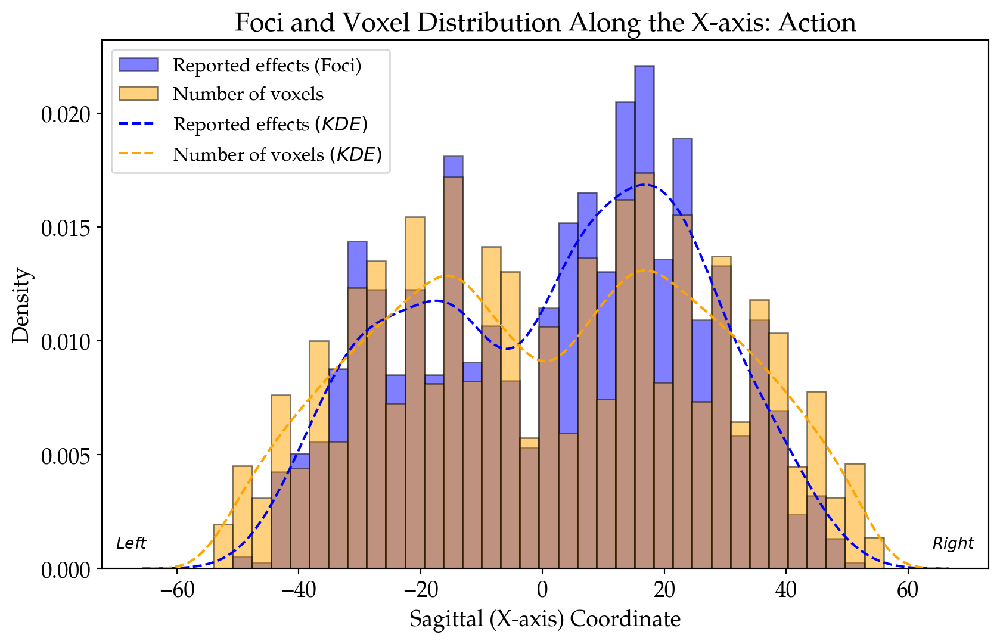

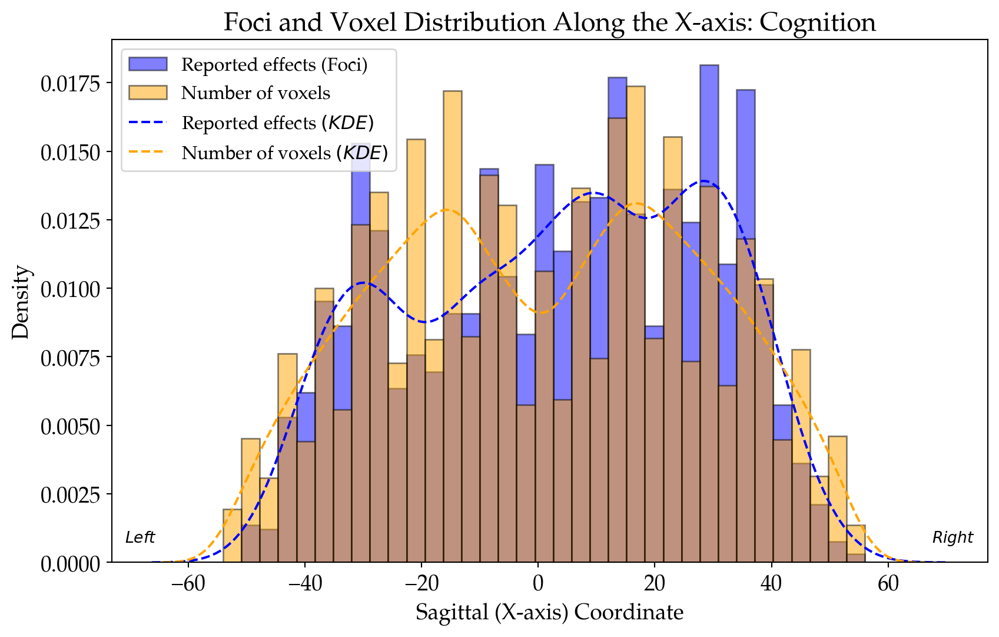

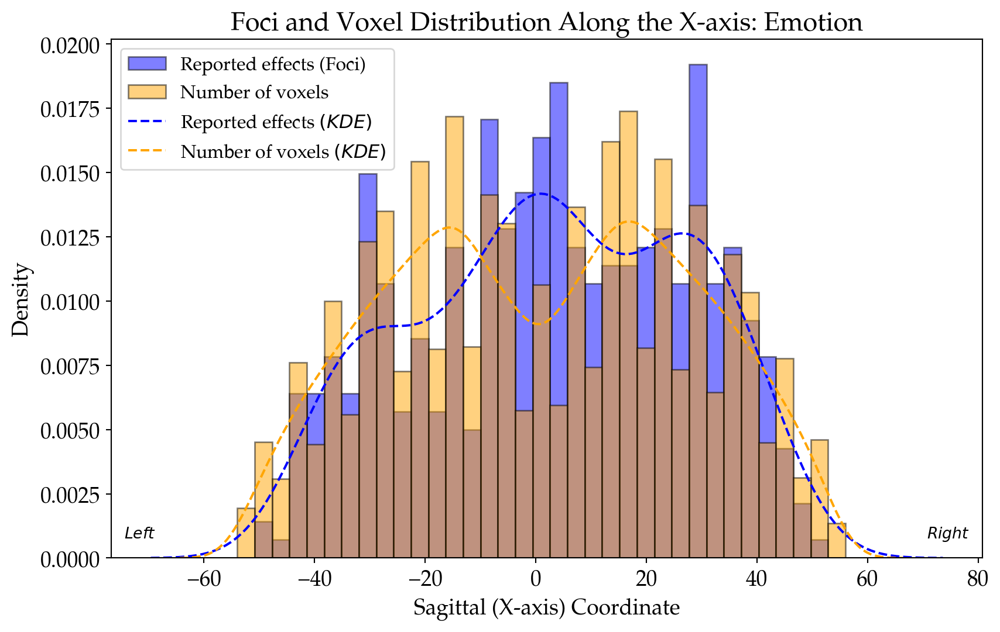

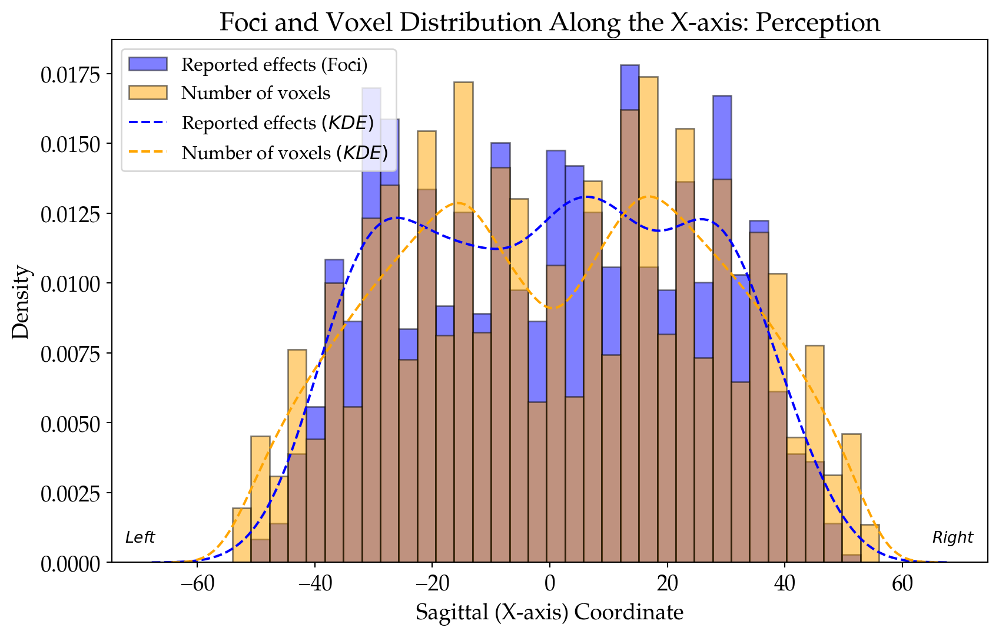

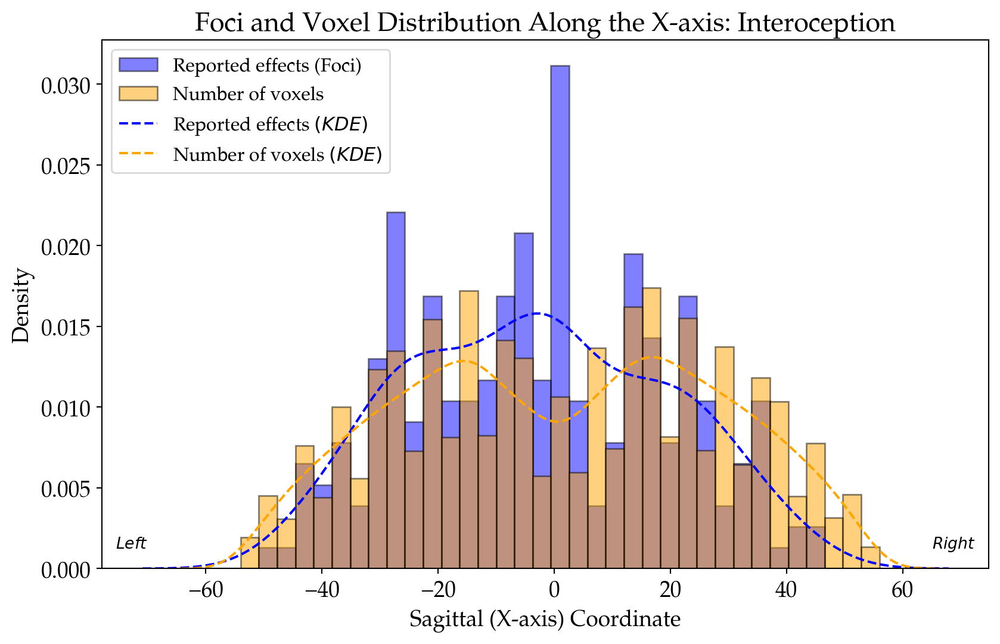

In [26]:
# Set plotting parameters
plt.rcParams["font.family"] = "Asana Math"
plt.rcParams["font.size"] = 14
plt.rcParams["figure.dpi"] = 192

# Define bins using the x-coordinates from all domains and the mask
all_y_coords = np.concatenate([xyz_cerebellum_dict[domain][:, 0] for domain in domains] + [mask_xyz[:, 0]])
bins = np.histogram_bin_edges(all_y_coords, bins=35)

# Plot the histograms for each domain in separate figures
for domain in domains:
    plt.figure(figsize=(10, 6))

    # Determine common bin edges for the histograms
    bins = np.histogram_bin_edges(np.concatenate([xyz_cerebellum_dict[domain][:, 0], mask_xyz[:, 0]]), bins=35)
    
    # Plot the histogram for the reported effects
    plt.hist(xyz_cerebellum_dict[domain][:, 0], bins=bins, density=True, alpha=0.5, label='Reported effects (Foci)', color='blue', edgecolor='black')
    
    # Plot the histogram for the number of voxels
    plt.hist(mask_xyz[:, 0], bins=bins, density=True, alpha=0.5, label='Number of voxels', color='orange', edgecolor='black')
    
    # Optionally, add KDE for smoothed distribution
    sns.kdeplot(xyz_cerebellum_dict[domain][:, 0], color='blue', label='Reported effects $\mathit{(KDE)}$', linestyle='--')
    sns.kdeplot(mask_xyz[:, 0], color='orange', label='Number of voxels $\mathit{(KDE)}$', linestyle='--')
    
    # Add legend and labels
    plt.legend(fontsize = 12, loc='upper left', bbox_to_anchor=(0.0, 1))
    plt.xlabel('Sagittal (X-axis) Coordinate')
    plt.ylabel('Density')
    plt.title(f'Foci and Voxel Distribution Along the X-axis: {domain.capitalize()}')

    # Add manual labels on the bottom left and right corners with offset
    x_offset = 0.015 * (plt.xlim()[1] - plt.xlim()[0])
    y_offset = 0.03 * (plt.ylim()[1] - plt.ylim()[0])
    
    plt.text(x=plt.xlim()[0] + x_offset, y=plt.ylim()[0] + y_offset, 
             s='$\mathit{Left}$', ha='left', va='bottom', fontsize=10)
    plt.text(x=plt.xlim()[1] - x_offset, y=plt.ylim()[0] + y_offset, 
             s='$\mathit{Right}$', ha='right', va='bottom', fontsize=10)

    save_path = os.path.join(BASE_DIR, f'Figures/Publication/Figure1/Supplementary/Foci_voxel_Distributions_{domain}_X-axis.png') 
    plt.savefig(save_path, bbox_inches = 'tight')
    
    # Show the plot
    # plt.show()

# Figure 1b: Create the cerebellar probability space that serves to sample null coordinates in a pseudorandom (biased) way.
## We first create the probability distribution for the whole brain.

In [27]:
# Get the dump dataset.
dump_dset = nimare.dataset.Dataset.load(os.path.join(OUTPUT_DIR, 'data/BrainMap_dump_Feb2024.pkl.gz'))
dump_dset

Dataset(8408 experiments, space='mni152_2mm')

In [28]:
# First, calculate kernels for all possible/ existing sample sizes across our set of experiments, and store them in a dictionary. 
kernels = {}
sample_sizes = sorted(dump_dset.metadata['sample_sizes'].apply(lambda c: c[0]).unique())
for sample_size in sample_sizes:
    _, kernels[sample_size] = nimare.meta.utils.get_ale_kernel(dump_dset.masker.mask_img, sample_size)

In [29]:
print(kernels[8].shape, kernels[44].shape) # Since we know that experiments sample sizes are between 8-44, we can use that to our advantage.

(19, 19, 19) (15, 15, 15)


In [30]:
# Double check whether kernels are actually equivalent to those calculated in the dump. Using the first experiment as example
# Old dump
dump_mat = scipy.io.loadmat(os.path.join(INPUT_DIR, 'BrainMap_dump_Feb2024/MACM19/BrainMapData/MetaMappingAnalysis_v7.mat'), simplify_cells=True)

In [31]:
dump_df = pd.DataFrame(dump_mat['Experiments']).drop(columns=['XYZ', 'UncertainTemplates', 'UncertainSubjects', 'Smoothing'])
dump_df.iloc[0]

BMid                                                        30001
EXid                                                            2
Author                                               Anderson N D
Year                                                         2000
Diagnosis                                                 Normals
StimModality                                   [Auditory, Visual]
StimType                                           [Tones, Words]
RespModality                                  [Hand, Oral/Facial]
RespType                                   [Button Press, Speech]
Instruction                                      [Encode, Recall]
ExtVariable                                                  None
Space                                              Talairach 1988
Context                                            Normal Mapping
Modality                                                      PET
Contrast                                              INSTRUCTION
PC        

In [32]:
# using nimare_gpu's funciton that doesn't trim the kernels
_, kernel_12 = nimare_gpu.utils.get_ale_kernel(dump_dset.masker.mask_img, 12)
np.isclose(dump_df.iloc[0]['Kernel'], kernel_12).all()

True

In [33]:
meta = nimare.meta.ale.ALE()
meta._collect_inputs(dump_dset)
meta._preprocess_input(dump_dset)

In [34]:
meta.inputs_['coordinates']

,id,study_id,contrast_id,x,y,z,space,i,j,k,sample_sizes,sample_size
41067,10010001-2,10010001,2,20.0,-10.0,56.0,mni152_2mm,55,58,64,[22],22.0
41068,10010001-2,10010001,2,-14.0,-20.0,8.0,mni152_2mm,38,53,40,[22],22.0
41065,10010001-2,10010001,2,-26.0,26.0,-6.0,mni152_2mm,32,76,33,[22],22.0
41064,10010001-2,10010001,2,-40.0,16.0,0.0,mni152_2mm,25,71,36,[22],22.0
41066,10010001-2,10010001,2,4.0,12.0,52.0,mni152_2mm,47,69,62,[22],22.0
...,...,...,...,...,...,...,...,...,...,...,...,...
41058,9120184-3,9120184,3,-32.0,24.0,38.0,mni152_2mm,29,75,55,[17],17.0
41060,9120184-3,9120184,3,-2.0,2.0,8.0,mni152_2mm,44,64,40,[17],17.0
41056,9120184-3,9120184,3,14.0,46.0,6.0,mni152_2mm,52,86,39,[17],17.0
41057,9120184-3,9120184,3,38.0,24.0,14.0,mni152_2mm,64,75,43,[17],17.0


In [35]:
prob_perm = np.zeros(dump_dset.masker.mask_img.shape)
for i, id in tqdm(enumerate(dump_dset.ids)):
    # get experiment ijk and kernel
    ijk = meta.inputs_['coordinates'].loc[meta.inputs_['coordinates']['id']==id, ['i', 'j', 'k']].values
    sample_size = dump_dset.metadata.iloc[i]['sample_sizes'][0]
    kernel = kernels[sample_size]

    # loop through foci and add up their kernels
    # centered at ijk of each focus
    mid = int(np.floor(kernel.shape[0] / 2.0))
    mid1 = mid + 1
    for j_peak in range(ijk.shape[0]):
        i, j, k = ijk[j_peak, :]
        xl = max(i - mid, 0)
        xh = min(i + mid1, prob_perm.shape[0])
        yl = max(j - mid, 0)
        yh = min(j + mid1, prob_perm.shape[1])
        zl = max(k - mid, 0)
        zh = min(k + mid1, prob_perm.shape[2])
        xlk = mid - (i - xl)
        xhk = mid - (i - xh)
        ylk = mid - (j - yl)
        yhk = mid - (j - yh)
        zlk = mid - (k - zl)
        zhk = mid - (k - zh)

        if (
            (xl >= 0)
            & (xh >= 0)
            & (yl >= 0)
            & (yh >= 0)
            & (zl >= 0)
            & (zh >= 0)
            & (xlk >= 0)
            & (xhk >= 0)
            & (ylk >= 0)
            & (yhk >= 0)
            & (zlk >= 0)
            & (zhk >= 0)
        ):
            prob_perm[xl:xh, yl:yh, zl:zh] += kernel[xlk:xhk, ylk:yhk, zlk:zhk]

8408it [01:19, 105.13it/s]


In [36]:
prob_perm_img = nilearn.image.new_img_like(dump_dset.masker.mask_img, prob_perm)

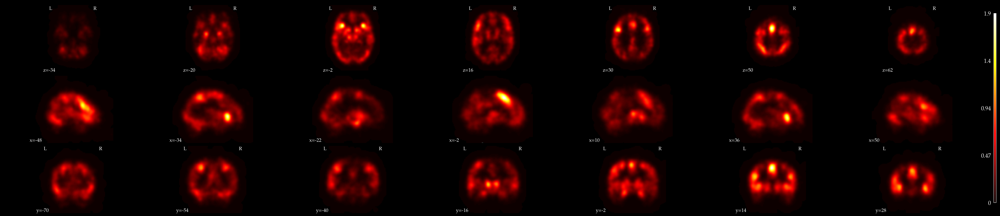

In [37]:
nilearn.plotting.plot_stat_map(prob_perm_img, display_mode='mosaic', black_bg=True, colorbar=True)

In [ ]:
# prob_perm_img.to_filename(os.path.join(OUTPUT_DIR, 'BrainMap_dump_Feb2024_kernels_sum.nii.gz')) 
# No need to overwrite this for us :).

In [38]:
# Save the figure without colorbar
display = nilearn.plotting.plot_stat_map(prob_perm_img, display_mode='mosaic', black_bg=True, colorbar=True)

# Save to file
display.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure1/Supplementary/whole-brain_probabilistic-space.png'))

# Close the display
display.close()

In [39]:
# Save the figure without colorbar
display = nilearn.plotting.plot_stat_map(prob_perm_img, display_mode='mosaic', black_bg=True, colorbar=False)

# Save to file
display.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure1/Supplementary/whole-brain_probabilistic-space-nocolorbar.png'))

# Close the display
display.close()

# Create the sampling probability map in the cerebellum

In [40]:
cerebellum_mask = nibabel.load(os.path.join(INPUT_DIR, 'maps/D2009_MNI.nii.gz'))
cerebellum_mask_dilated =  nibabel.load(os.path.join(INPUT_DIR, 'maps/D2009_MNI_dilated-6mm.nii.gz')) # We dilated the cerebellar mask 6mm in each direction to allow for effects slightly out of the mask (accounting for missalignments).

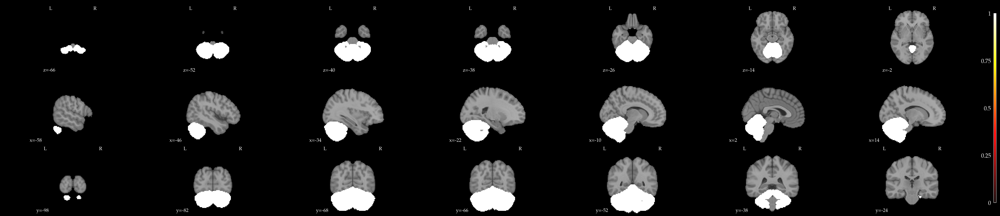

In [41]:
# Resample the mask to the probability map
cerebellum_mask_resampled = nilearn.image.resample_to_img(cerebellum_mask_dilated, prob_perm_img, interpolation='nearest')

# just to make sure resampling was done correctly
nilearn.plotting.plot_stat_map(cerebellum_mask_resampled, display_mode='mosaic', black_bg=True)

In [42]:
prob_perm_masked = prob_perm[cerebellum_mask_resampled.get_fdata().astype(bool)]

In [43]:
sampling_prob = prob_perm_masked / prob_perm_masked.sum()

In [44]:
masker = nilearn.maskers.NiftiMasker(cerebellum_mask_resampled)
masker.fit()

NiftiMasker(mask_img=<nibabel.nifti1.Nifti1Image object at 0x14c1dbbe3050>)

In [45]:
sampling_prob_img = masker.inverse_transform(sampling_prob)

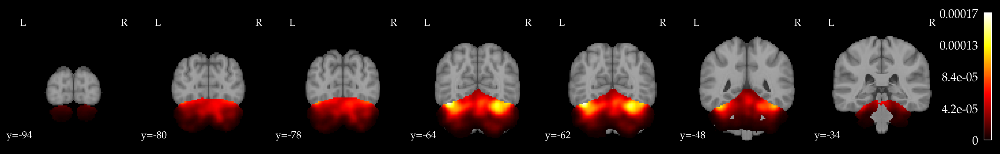

In [46]:
nilearn.plotting.plot_stat_map(sampling_prob_img, display_mode='y', black_bg=True)

# Figure 1B: Cerebellar probabilistic space

INFO:matplotlib.texmanager:font.family must be one of (serif, sans-serif, cursive, monospace) when text.usetex is True. serif will be used by default.
INFO:matplotlib.texmanager:font.family must be one of (serif, sans-serif, cursive, monospace) when text.usetex is True. serif will be used by default.
INFO:matplotlib.texmanager:font.family must be one of (serif, sans-serif, cursive, monospace) when text.usetex is True. serif will be used by default.
INFO:matplotlib.texmanager:font.family must be one of (serif, sans-serif, cursive, monospace) when text.usetex is True. serif will be used by default.
INFO:matplotlib.texmanager:font.family must be one of (serif, sans-serif, cursive, monospace) when text.usetex is True. serif will be used by default.
INFO:matplotlib.texmanager:font.family must be one of (serif, sans-serif, cursive, monospace) when text.usetex is True. serif will be used by default.
INFO:matplotlib.texmanager:font.family must be one of (serif, sans-serif, cursive, monospace) 

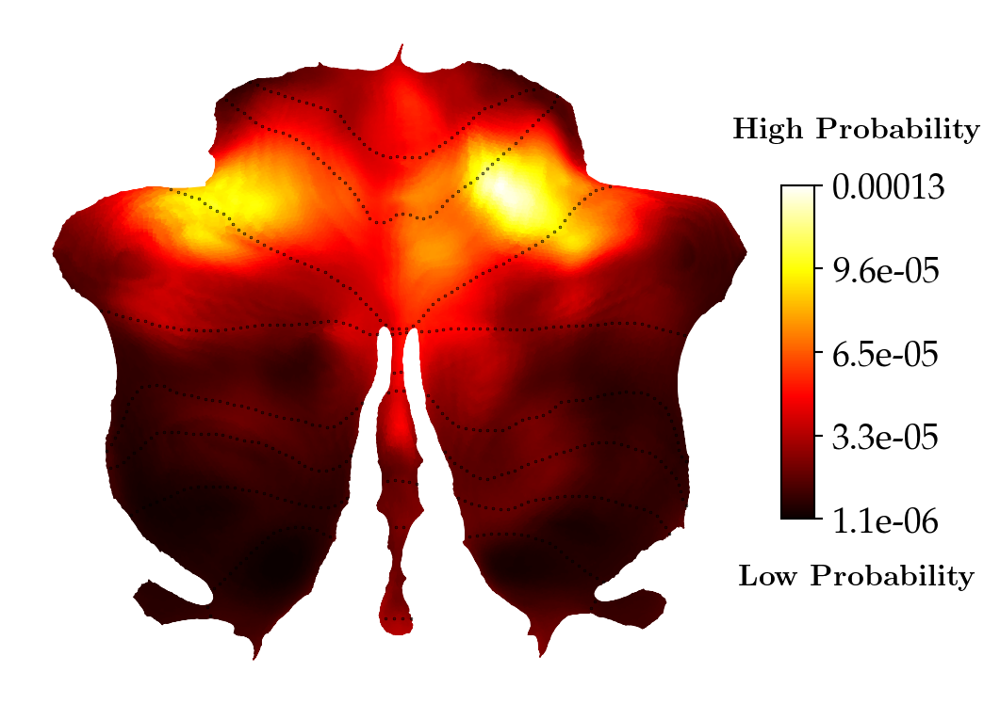

In [81]:
sampling_prob_surf = SUITPy.flatmap.vol_to_surf(sampling_prob_img, space = 'SPM').squeeze()
SUITPy.flatmap.plot(sampling_prob_surf, colorbar=True, new_figure=False, bordersize=0.5, cmap='hot')

# Get the current figure and axis
fig = plt.gcf()
ax = plt.gca()

# Add text labels to the figure with LaTeX formatting for bold text
plt.rcParams['text.usetex'] = True
## Note that it may not always be desirable to enablt LaTex in matplotilib plotting. Disable it after if you wish.

fig.text(0.85, 0.235, r'$\textbf{Low Probability}$', va='center', ha='center', fontsize=12)
fig.text(0.85, 0.75, r'$\textbf{High Probability}$', va='center', ha='center', fontsize=12)

# Save the current figure to a file
plt.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure1/1b_cerebellar_probabilistic-space.png'))

# Show the plot
plt.show()


# 1B-inset: Illustrate the null hypothesis of classic ALE

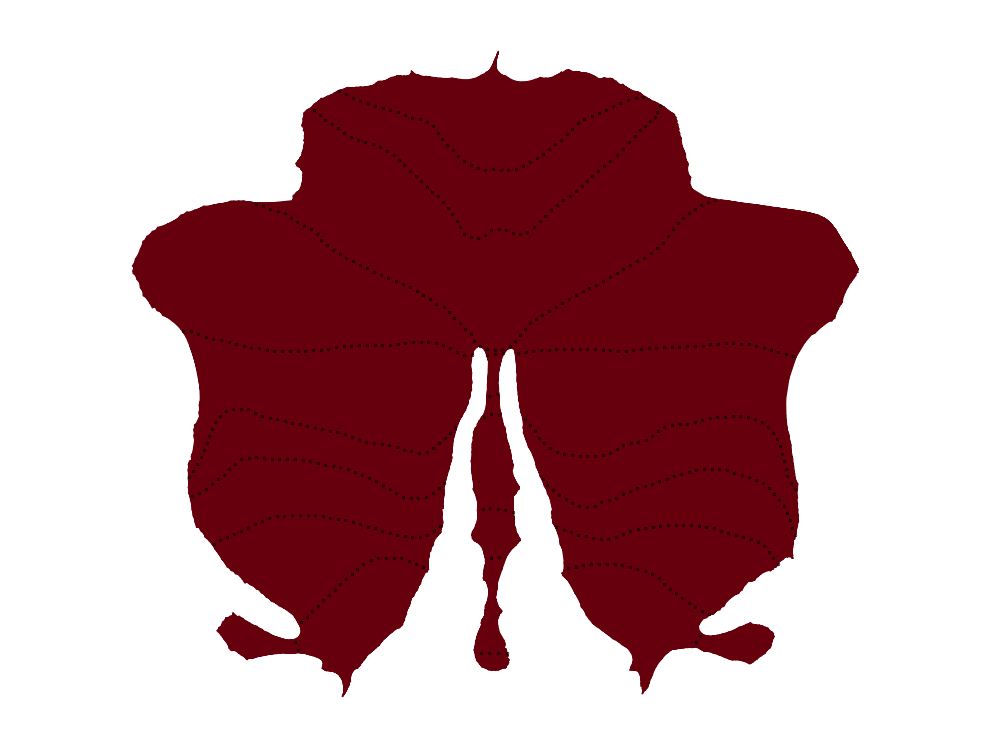

In [82]:
# Disable LaTex
plt.rcParams['text.usetex'] = False

# Hacky workaround to make a flat-colored cerebellar cerebellar flatmap.
# Extract the top color from the 'Reds' colormap
top_color = plt.cm.Reds(1.0)

# Create a custom colormap with the top color on both ends
cmap = mcolors.LinearSegmentedColormap.from_list('custom_reds', [top_color, top_color], N=256)

# Generate the map of a constant value (e.g., 0.5)
sampling_prob_surf = np.full_like(SUITPy.flatmap.vol_to_surf(sampling_prob_img).squeeze(), 0.99)

# Choose a random index and assign it the value 0.98
random_index = np.unravel_index(np.random.choice(sampling_prob_surf.size), sampling_prob_surf.shape)
sampling_prob_surf[random_index] = 0.98

# Plot the flatmap using the custom colormap
SUITPy.flatmap.plot(sampling_prob_surf, colorbar=False, new_figure=False, bordersize=0.5, cmap=cmap)

# Get the current figure and axis
fig = plt.gcf()
ax = plt.gca()

# Save the current figure to a file
plt.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure1/1b-inset_regularALE.png'))

# Show the plot
plt.show()


# Figure 1c, d: Classic ALE and C-SALE result maps for Behavioral Domains

Prepare the flatmap mesh and the number of experiments per BD.

In [48]:
flat_mesh = nilearn.surface.load_surf_mesh(os.path.join(INPUT_DIR, 'maps/FLAT.surf.gii'))
flat_mesh

mesh(coordinates=array([[ 21.189785 ,   2.5686152,   0.       ],
       [ 20.541264 ,   2.4435081,   0.       ],
       [ 19.67503  ,   1.8180358,   0.       ],
       ...,
       [-29.824383 ,  74.66718  ,   0.       ],
       [-29.369013 ,  75.676094 ,   0.       ],
       [-29.696808 ,  75.297424 ,   0.       ]], dtype=float32), faces=array([[    0,     1,     7],
       [    8,     7,     1],
       [    0,   138,     1],
       ...,
       [27862, 27938, 27871],
       [27862, 27943, 27938],
       [27871, 27938, 27879]], dtype=int32))

In [49]:
# Add the number of experiments:
domain_exps = {
    'Action': 259,
    'Cognition': 750,
    'Emotion': 225,
    'Interoception': 70,
    'Perception': 355
}

In [50]:
domains = ['Action', 'Cognition', 'Emotion', 'Interoception', 'Perception']
MASK_NAME = 'D2009_MNI'
mask_img = os.path.join(INPUT_DIR, f'maps/{MASK_NAME}.nii.gz')
k = 50

# Initialize dictionaries to store results
ALE_zmaps = {}
ALE_surf_zmaps = {}
ALE_zmaps_thr_strict = {}
ALE_surf_zmaps_thr_strict = {}

for domain in domains:
    domain_path = os.path.join(OUTPUT_DIR, 'ALE', f'{domain}', f'{domain}')
    all_domains = os.listdir(domain_path)
    
    # Load uncorrected results
    z_orig = nibabel.load(os.path.join(domain_path, 'uncorr_z.nii.gz'))
        
    # Mask to the proper mask
    z_masked = nilearn.image.math_img("m * img", img=z_orig, m=mask_img)
        
    # Record 3D and flattened unthresholded images
    ALE_zmaps[domain] = z_masked
    ALE_surf_zmaps[domain] = SUITPy.flatmap.vol_to_surf(ALE_zmaps[domain], space='SPM').squeeze() # Add space = 'SPM' to match BrainMap.
        
    # Define path for corrected cluster result (strict)
    corr_cluster_z_path_strict = os.path.join(domain_path, f'cFWE_z_desc-mass_level-cluster_corr-FWE_method-montecarlo.nii.gz') # We used mass rather than size for cluster extent thresholding.
        
    # Check if the file exists
    if os.path.exists(corr_cluster_z_path_strict):
        # Record 3D and flattened thresholded (Strict, p<0.001 and K=50) images
        ALE_zmaps_thr_strict[domain] = nibabel.load(corr_cluster_z_path_strict)
        ALE_surf_zmaps_thr_strict[domain] = SUITPy.flatmap.vol_to_surf(ALE_zmaps_thr_strict[domain], space='SPM').squeeze()
    else:
        print(f"Corrected cluster result not found for domain: {domain}")

In [51]:
def get_flatmap_mask_boundaries(domain, surf_zmaps_thr):
    mask = (ALE_surf_zmaps_thr_strict[domain] > 0).astype(int)
    outline = np.zeros_like(mask, dtype=int)
    mesh = nilearn.surface.load_surf_mesh(os.path.join(INPUT_DIR, 'maps/FLAT.surf.gii'))
    boundary_faces = (mask[mesh.faces].sum(axis=1) == 1)
    mask_boundary_verts = list(
        set(mesh.faces[boundary_faces].flatten()) & \
        set(np.where(mask)[0])
    )
    outline[mask_boundary_verts] = 1
    return outline


# First for Classic ALE

In [52]:
# Dictionary to store boundaries for each domain
boundaries_dict = {}

# Iterate over domains and compute boundaries
for domain in domains:
    boundaries_dict[domain] = get_flatmap_mask_boundaries(domain, ALE_surf_zmaps_thr_strict)

# This should now have put boundaries for every domain in boundaries_dict
# Check that keys exist for all domains.

In [53]:
# Initialize dictionaries to store cluster borders, outline, and boundary faces for each domain
cluster_borders_dict = {}
outline_dict = {}
boundary_faces_dict = {}

# Define the flatmap mesh
mesh = nilearn.surface.load_surf_mesh(os.path.join(INPUT_DIR, 'maps/FLAT.surf.gii'))

# Loop over domains
for domain in domains:
    # Get the binary mask for the current domain
    mask = (ALE_surf_zmaps_thr_strict[domain] > 0).astype(int)

    # Get the coordinates of the boundary vertices for the current domain
    outline_dict[domain] = np.zeros_like(mask, dtype=int)
    boundary_faces = (mask[mesh.faces].sum(axis=1) == 1)
    mask_boundary_verts = list(
        set(mesh.faces[boundary_faces].flatten()) & set(np.where(mask)[0])
    )
    cluster_borders_dict[domain] = mesh.coordinates[mask_boundary_verts]

    # Smoothing iterations
    iterations = 2
    for i in range(iterations):
        distmat = scipy.spatial.distance_matrix(cluster_borders_dict[domain], cluster_borders_dict[domain])
        distmat[distmat == 0] = np.NaN
        neighbors = np.where(distmat < 5)
        new_points = (cluster_borders_dict[domain][neighbors[0]] + cluster_borders_dict[domain][neighbors[1]]) / 2
        cluster_borders_dict[domain] = np.concatenate([cluster_borders_dict[domain], new_points], axis=0)


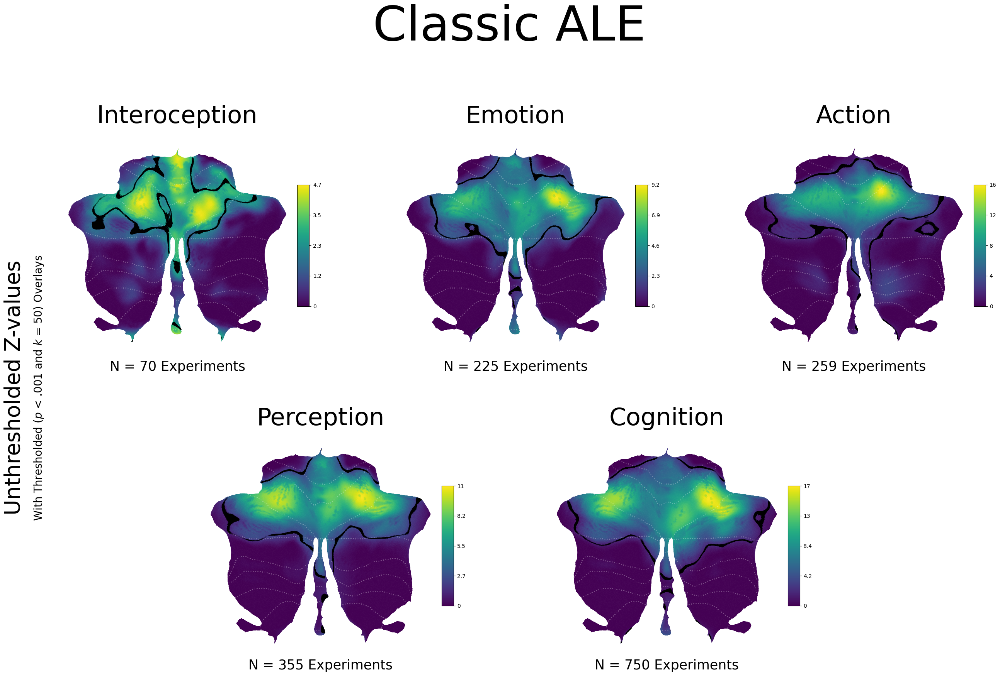

In [12]:
# Create a new figure
fig = plt.figure(figsize=(32, 18)) 

# Order the domains based on the number of experiments
domain_order = pd.Series(domain_exps).sort_values().index

# Loop over domains and create subplots for each of them
for i, domain in enumerate(domain_order):
    if i < 3:
        ax = fig.add_subplot(2, 3, i + 1)
    else:
        # Create custom axes positions for the bottom row plots (to center them)
        left = 0.24 + (i - 3) * 0.28
        bottom = 0.1
        width = 0.2 * 1.15
        height = 0.3 * 1.15
        ax = fig.add_axes([left, bottom, width, height])

    # Plot the background map for each domain
    SUITPy.flatmap.plot(ALE_surf_zmaps[domain], colorbar=True, new_figure=False, bordersize=0.5, cmap='viridis', bordercolor = 'white')

    # Overlay the cluster borders on top
    ax.plot(cluster_borders_dict[domain][:, 0], cluster_borders_dict[domain][:, 1], color='black',
            marker='.', linestyle=None, markersize=0.05, linewidth=0)

    # Set titles and labels as needed
    ax.set_title(f"{domain}", fontsize=45, y = 0.99)
    ax.text(0.5, 0.0, f'N = {domain_exps[domain]} Experiments', fontsize=25, ha='center', va='center', transform=ax.transAxes)


# Add a rotated y-label for the entire plot
fig.text(0.09, 0.5, 'Unthresholded Z-values', va='center', ha='center', rotation='vertical', fontsize=40)

# Add a subtitle for the y-label
fig.text(0.11, 0.5, 'With Thresholded ($\mathit{p}$ < .001 and $\mathit{k}$ = 50) Overlays', va='center', ha='center', rotation='vertical', fontsize=20)

fig.text(0.38, 1.0, 'Classic ALE', fontsize=90)

# Save figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure1/1c_ALE_bd_unthres_wthres'), bbox_inches='tight')

# Show the plot
plt.show()


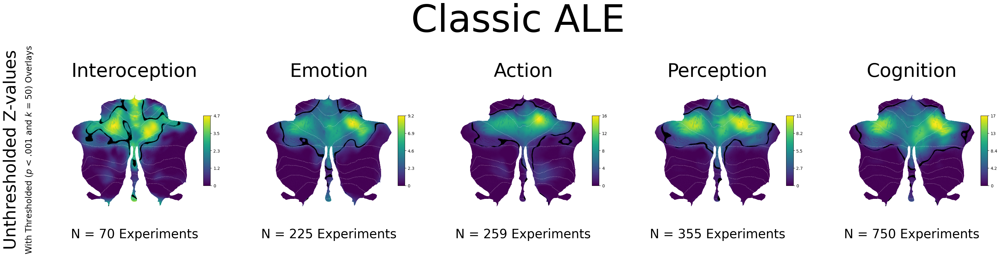

In [24]:
# Create a new figure
fig = plt.figure(figsize=(40, 6)) # Much wider to accomodate 5 plots in one row

# Order the domains based on the number of experiments
domain_order = pd.Series(domain_exps).sort_values().index

# Loop over domains and create subplots for each of them
for i, domain in enumerate(domain_order):
    ax = fig.add_subplot(1,5, i + 1)

    # Plot themap for each domain
    SUITPy.flatmap.plot(ALE_surf_zmaps[domain], colorbar=True, new_figure=False, bordersize=0.5, cmap = 'viridis', bordercolor='white')

    # Overlay the cluster borders on top
    ax.plot(cluster_borders_dict[domain][:, 0], cluster_borders_dict[domain][:, 1], color='black',
           marker='.', linestyle=None, markersize=0.01, linewidth=0)
    

    # Set titles and labels as needed
    ax.set_title(f"{domain}", fontsize = 45)
    ax.text(0.5, -0.1, f'N = {domain_exps[domain]} Experiments', fontsize=30, ha='center', va='center', transform=ax.transAxes)

# Adjust layout
# plt.tight_layout()

# Add a rotated y-label for the entire plot
fig.text(0.08, 0.5, 'Unthresholded Z-values', va='center', ha='center', rotation='vertical', fontsize=40)

# Add a subtitle for the y-label
fig.text(0.095, 0.5, 'With Thresholded ($\mathit{p}$ < .001 and $\mathit{k}$ = 50) Overlays', va='center', ha='center', rotation='vertical', fontsize=20)

fig.text(0.41, 1.15, 'Classic ALE', fontsize=90)

# Save figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure1/1c_ALE_bd_unthres_wthres-oneRow'), bbox_inches='tight')

# Show the plot
plt.show()

# Then for the new method: Cerebelum-Specific ALE (C-SALE)

In [54]:
MASK_NAME = 'D2009_MNI'
mask_img = (os.path.join(INPUT_DIR, f'maps/{MASK_NAME}.nii.gz'))
k = 50

# Initialize dictionaries to store results
SALE_zmaps = {}
SALE_surf_zmaps = {}
SALE_zmaps_thr_strict = {}
SALE_surf_zmaps_thr_strict = {}


for domain in domains:
    domain_path = os.path.join(OUTPUT_DIR, 'SALE', f'{domain}', f'{domain}') # note that the folder is not called C-SALE, but simply 'SALE' since the method will ultimately not only work for the cerebellum.
    all_domains = os.listdir(domain_path)

    # Load uncorrected results
    z_orig = nibabel.load(os.path.join(domain_path, 'uncorr_z.nii.gz'))
        
    # Mask to the proper mask
    z_masked = nilearn.image.math_img("m * img", img=z_orig, m=mask_img)
        
    # Record 3D and flattened unthresholded images
    SALE_zmaps[domain] = z_masked
    SALE_surf_zmaps[domain] = SUITPy.flatmap.vol_to_surf(SALE_zmaps[domain], space='SPM').squeeze()
        
    # Define path for corrected cluster result (strict)
    corr_cluster_z_path_strict = os.path.join(domain_path, f'corr_cluster_h-001_k-{k}_mask-{MASK_NAME}_z.nii.gz')
        
    # Check if the file exists
    if os.path.exists(corr_cluster_z_path_strict):
        # Record 3D and flattened thresholded (Strict, p<0.001 and K=50) images
        SALE_zmaps_thr_strict[domain] = nibabel.load(corr_cluster_z_path_strict)
        SALE_surf_zmaps_thr_strict[domain] = SUITPy.flatmap.vol_to_surf(SALE_zmaps_thr_strict[domain], space='SPM').squeeze()
    else:
        print(f"Corrected cluster result not found for domain: {domain}")

In [55]:
# Dictionary to store boundaries for each domain
boundaries_dict_SALE = {}

# Iterate over domains and compute boundaries
for domain in domains:
    boundaries_dict_SALE[domain] = get_flatmap_mask_boundaries(domain, SALE_surf_zmaps_thr_strict)

# This should now have put boundaries for every domain in boundaries_dict
# Check that keys exist for all domains.

In [56]:
# Initialize dictionaries to store cluster borders, outline, and boundary faces for each domain
cluster_borders_dict_SALE = {}
outline_dict_SALE = {}
boundary_faces_dict_SALE = {}

# Define the flatmap mesh
mesh = nilearn.surface.load_surf_mesh(os.path.join(INPUT_DIR, 'maps/FLAT.surf.gii'))

# Loop over domains
for domain in domains:
    # Get the binary mask for the current domain
    mask = (SALE_surf_zmaps_thr_strict[domain] > 0).astype(int)

    # Get the coordinates of the boundary vertices for the current domain
    outline_dict_SALE[domain] = np.zeros_like(mask, dtype=int)
    boundary_faces = (mask[mesh.faces].sum(axis=1) == 1)
    mask_boundary_verts = list(
        set(mesh.faces[boundary_faces].flatten()) & set(np.where(mask)[0])
    )
    cluster_borders_dict_SALE[domain] = mesh.coordinates[mask_boundary_verts]

    # Smoothing iterations
    iterations = 2
    for i in range(iterations):
        distmat = scipy.spatial.distance_matrix(cluster_borders_dict_SALE[domain], cluster_borders_dict_SALE[domain])
        distmat[distmat == 0] = np.NaN
        neighbors = np.where(distmat < 5)
        new_points = (cluster_borders_dict_SALE[domain][neighbors[0]] + cluster_borders_dict_SALE[domain][neighbors[1]]) / 2
        cluster_borders_dict_SALE[domain] = np.concatenate([cluster_borders_dict_SALE[domain], new_points], axis=0)


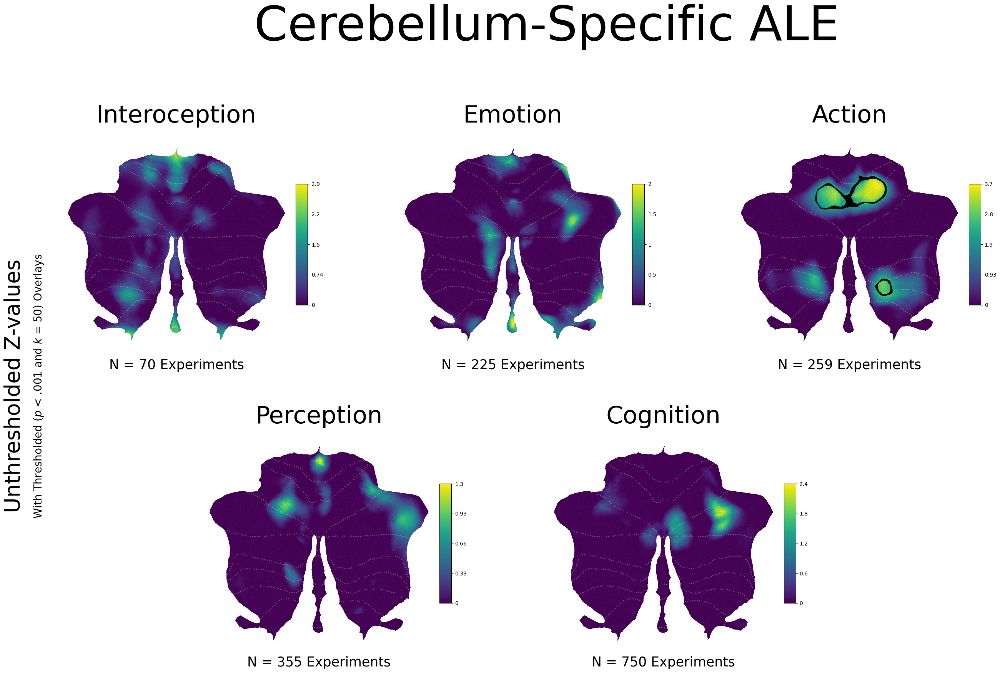

In [28]:
# Create a new figure
fig = plt.figure(figsize=(32, 18))

# Order the domains based on the number of experiments
domain_order = pd.Series(domain_exps).sort_values().index

# Loop over domains and create subplots for each of them
for i, domain in enumerate(domain_order):
    if i < 3:
        ax = fig.add_subplot(2, 3, i + 1)
    else:
        # Create custom axes positions for the bottom row plots
        left = 0.24 + (i - 3) * 0.28
        bottom = 0.1
        width = 0.2 * 1.15
        height = 0.3 * 1.15
        ax = fig.add_axes([left, bottom, width, height])

    # Plot the background map for each domain
    SUITPy.flatmap.plot(SALE_surf_zmaps[domain], colorbar=True, new_figure=False, bordersize=0.5, cmap='viridis', bordercolor = 'white')

    # Overlay the cluster borders on top
    ax.plot(cluster_borders_dict_SALE[domain][:, 0], cluster_borders_dict_SALE[domain][:, 1], color='black',
            marker='.', linestyle=None, markersize=0.05, linewidth=0)

    # Set titles and labels as needed
    ax.set_title(f"{domain}", fontsize=45, y = 0.99)
    ax.text(0.5, 0.0, f'N = {domain_exps[domain]} Experiments', fontsize=25, ha='center', va='center', transform=ax.transAxes)

# Add a rotated y-label for the entire plot
fig.text(0.09, 0.5, 'Unthresholded Z-values', va='center', ha='center', rotation='vertical', fontsize=40)

# Add a subtitle for the y-label
fig.text(0.11, 0.5, 'With Thresholded ($\mathit{p}$ < .001 and $\mathit{k}$ = 50) Overlays', va='center', ha='center', rotation='vertical', fontsize=20)

fig.text(0.285, 1.0, 'Cerebellum-Specific ALE', fontsize=90)

# Save figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure1/1d_C-SALE_bd_unthres_wthres'), bbox_inches='tight')

# Show the plot
plt.show()


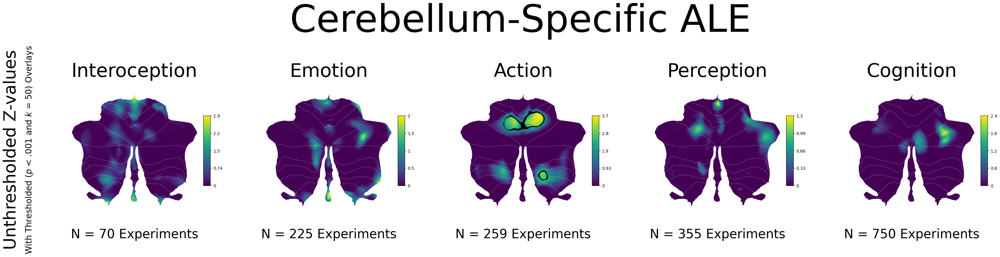

In [32]:
# Create a new figure
fig = plt.figure(figsize=(40, 6)) # Much wider to accomodate 5 plots in one row

# Order the domains based on the number of experiments
domain_order = pd.Series(domain_exps).sort_values().index

# Loop over domains and create subplots for each of them
for i, domain in enumerate(domain_order):
    ax = fig.add_subplot(1,5, i + 1)

    # Plot themap for each domain
    SUITPy.flatmap.plot(SALE_surf_zmaps[domain], colorbar=True, new_figure=False, bordersize=0.5, cmap = 'viridis', bordercolor='white')

    # Overlay the cluster borders on top
    ax.plot(cluster_borders_dict_SALE[domain][:, 0], cluster_borders_dict_SALE[domain][:, 1], color='black',
           marker='.', linestyle=None, markersize=0.01, linewidth=0)
    

    # Set titles and labels as needed
    ax.set_title(f"{domain}", fontsize = 45)
    ax.text(0.5, -0.1, f'N = {domain_exps[domain]} Experiments', fontsize=30, ha='center', va='center', transform=ax.transAxes)

# Adjust layout
# plt.tight_layout()

# Add a rotated y-label for the entire plot
fig.text(0.08, 0.5, 'Unthresholded Z-values', va='center', ha='center', rotation='vertical', fontsize=40)

# Add a subtitle for the y-label
fig.text(0.095, 0.5, 'With Thresholded ($\mathit{p}$ < .001 and $\mathit{k}$ = 50) Overlays', va='center', ha='center', rotation='vertical', fontsize=20)

fig.text(0.31, 1.15, 'Cerebellum-Specific ALE', fontsize=90)

# Save figure
fig.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure1/1d_C-SALE_bd_unthres_wthres-oneRow'), bbox_inches='tight')


# Show the plot
plt.show()

# Last, we assessed spatial correlations between BDs and Subdomains.
## We did this for both methods, minding the idea that spatial correlation should generally be low given the premise of our analysis.

In [57]:
subdomain_labels = pd.Series({
    'Action': 'Action',
    'Cognition': 'Cognition',
    'Perception': 'Perception',
    'Emotion': 'Emotion',
    'Interoception': 'Interoception',
    'Action.MotorLearning': 'Motor Learning',
    'Action.Observation': 'Observation',
    'Action.Execution.Speech': 'Speech Execution',
    'Action.Inhibition': 'Inhibition',
    'Action.Execution': 'Execution',
    'Action.Preparation': 'Preparation',
    'Action.Imagination': 'Imagination',
    'Cognition.Spatial': 'Spatial',
    'Cognition.SocialCognition': 'Social Cognition',
    'Cognition.Attention': 'Attention',
    'Cognition.Language.Syntax': 'Syntax',
    'Cognition.Memory': 'Memory',
    'Cognition.Memory.Explicit': 'Explicit Memory',
    'Cognition.Language': 'Language',
    'Cognition.Language.Semantics': 'Semantics',
    'Cognition.Memory.Working': 'Working Memory',
    'Cognition.Language.Phonology': 'Phonology',
    'Cognition.Reasoning': 'Reasoning',
    'Cognition.Temporal': 'Temporal',
    'Cognition.Language.Speech': 'Speech',
    'Cognition.Language.Orthography': 'Orthography',
    'Cognition.Music': 'Music',
    'Emotion.Positive.RewardGain': 'Reward/ Gain',
    'Emotion.Negative.Disgust': 'Disgust',
    'Emotion.Positive': 'Positive Emotion',
    'Emotion.Negative.Fear': 'Fear',
    'Emotion.Positive.Happiness': 'Happiness',
    'Emotion.Negative.Sadness': 'Sadness',
    'Emotion.Negative': 'Negative Emotion',
    'Emotion.Valence': 'Valence',
    'Emotion.Negative.Anger': 'Anger',
    'Emotion.Negative.Anxiety': 'Anxiety',
    'Perception.Vision': 'Vision',
    'Perception.Olfaction': 'Olfaction',
    'Perception.Vision.Motion': 'Vision - Motion',
    'Perception.Gustation': 'Gustation',
    'Perception.Somesthesis.Pain': 'Pain',
    'Perception.Audition': 'Audition',
    'Perception.Somesthesis': 'Somesthesis',
    'Perception.Vision.Color': 'Vision - Color',
    'Perception.Vision.Shape': 'Vision - Shape',
    'Interoception.Sexuality': 'Sexuality',
    'Interoception.RespirationRegulation': 'Respiration Regulation',
    'Interoception.Hunger': 'Hunger'
})

# We first create full correlation matrices for (sub)BDs (for in the supplements)

/tmp/ipykernel_4122290/1801088251.py:11: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage_matrix = sch.linkage(distance_matrix, method='average')


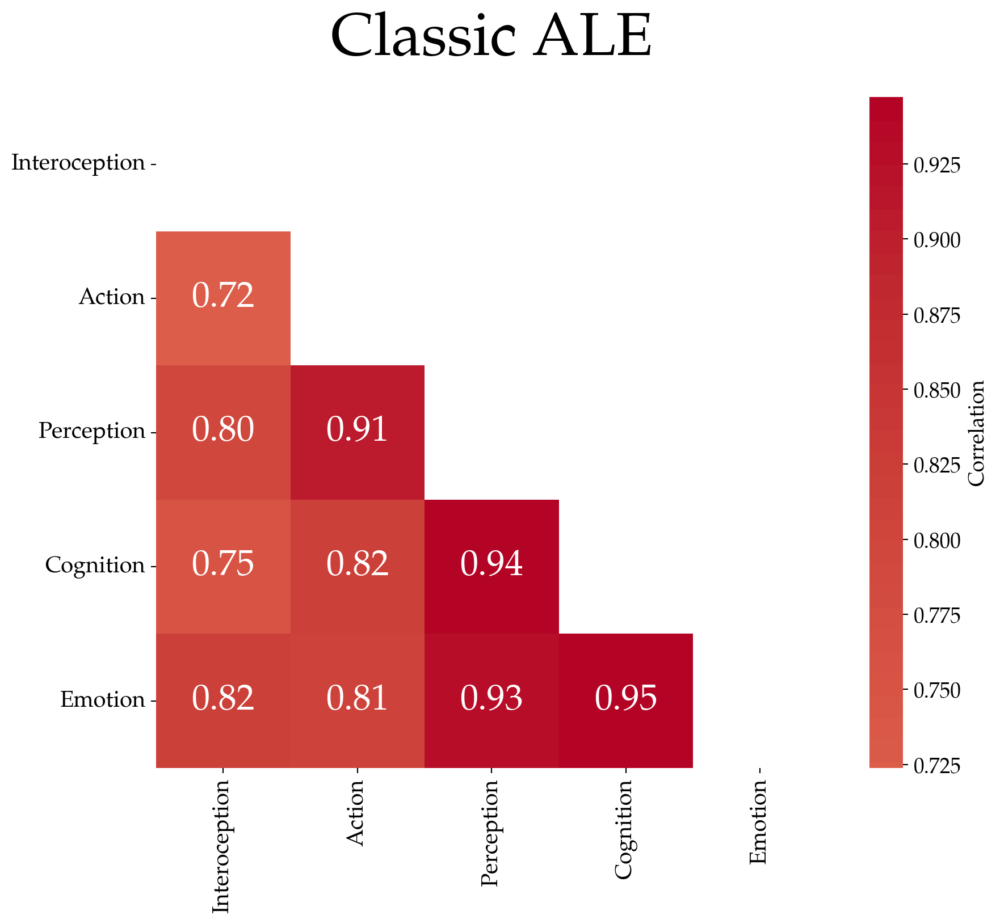

In [59]:
# Initialize the cross-correlation DataFrame
bd_cross_corr = pd.DataFrame(dtype=float)

# Calculate the correlation matrix
for i, m_i in enumerate(ALE_surf_zmaps.keys()):
    for j, m_j in enumerate(ALE_surf_zmaps.keys()):
        bd_cross_corr.loc[m_i, m_j] = scipy.stats.pearsonr(ALE_surf_zmaps[m_i], ALE_surf_zmaps[m_j]).statistic

# Perform hierarchical clustering
distance_matrix = 1 - bd_cross_corr  # Convert correlation to distance
linkage_matrix = sch.linkage(distance_matrix, method='average')

# Create a dendrogram to get the order of the leaves
dendro = sch.dendrogram(linkage_matrix, labels=bd_cross_corr.index, no_plot=True)
ordered_leaves = dendro['ivl']

# Reorder the correlation matrix
bd_ordered_cross_corr = bd_cross_corr.loc[ordered_leaves, ordered_leaves]

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(bd_ordered_cross_corr, dtype=bool))

# Set diagonal to beige and hide the annotation for the diagonal
for i in range(len(bd_ordered_cross_corr)):
    bd_ordered_cross_corr.iat[i, i] = np.nan  # Hide the correlation coefficient for the diagonal

# Plot the reordered correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
ax = sns.heatmap(
    bd_ordered_cross_corr, 
    annot=True, 
    fmt=".2f", 
    cmap='coolwarm', 
    cbar_kws={'label': 'Correlation'}, 
    annot_kws={"fontsize": 24},  # Adjust the font size of the annotations
    center=0.0,  # Center the colormap at 0.0
    mask=mask,  # Mask the upper triangle
    square=True  # Keep the cells square-shaped
)

# Explicitly set the ticks and labels on the heatmap axes
ax.set_xticks(np.arange(len(bd_ordered_cross_corr.columns)) + 0.5)
ax.set_yticks(np.arange(len(bd_ordered_cross_corr.index)) + 0.5)
ax.set_xticklabels(bd_ordered_cross_corr.columns, size=15, rotation=90)
ax.set_yticklabels(bd_ordered_cross_corr.index, size=15, rotation=0)

plt.title('Classic ALE', y = 1.05, fontsize = 40) # Hierarchical Clustering of Correlation Matrix 

# Save figure
ax.figure.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure1/Supplementary/ALE_bd-spatialCorrelation.png'), bbox_inches='tight')

plt.show()

/tmp/ipykernel_4122290/754155000.py:11: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage_matrix = sch.linkage(distance_matrix, method='average')


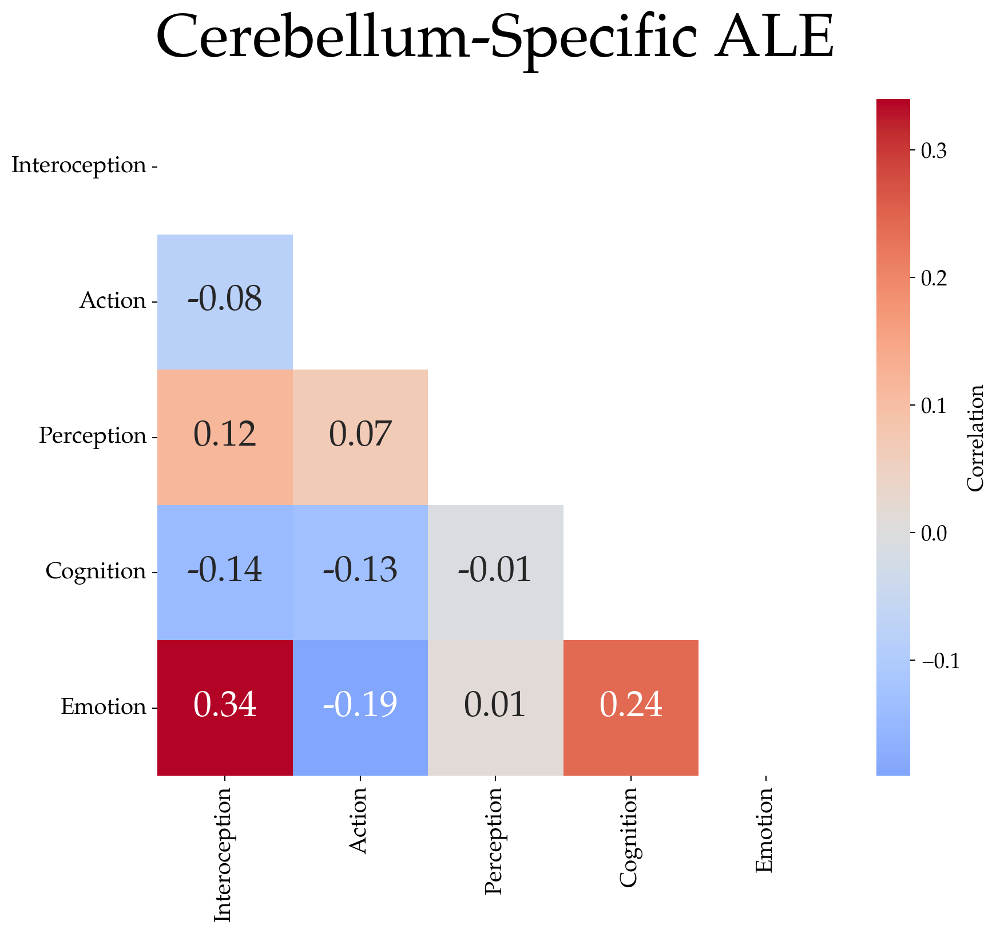

In [60]:
# Initialize the cross-correlation DataFrame
bd_cross_corr_SALE = pd.DataFrame(dtype=float)

# Calculate the correlation matrix
for i, m_i in enumerate(SALE_surf_zmaps.keys()):
    for j, m_j in enumerate(SALE_surf_zmaps.keys()):
        bd_cross_corr_SALE.loc[m_i, m_j] = scipy.stats.pearsonr(SALE_surf_zmaps[m_i], SALE_surf_zmaps[m_j]).statistic

# Perform hierarchical clustering
distance_matrix = 1 - bd_cross_corr  # Convert correlation to distance
linkage_matrix = sch.linkage(distance_matrix, method='average')

# Create a dendrogram to get the order of the leaves
dendro = sch.dendrogram(linkage_matrix, labels=bd_cross_corr_SALE.index, no_plot=True)
ordered_leaves = dendro['ivl']

# Reorder the correlation matrix
bd_ordered_cross_corr_SALE = bd_cross_corr_SALE.loc[ordered_leaves, ordered_leaves]

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(bd_ordered_cross_corr_SALE, dtype=bool))

# Set diagonal to beige and hide the annotation for the diagonal
for i in range(len(bd_ordered_cross_corr_SALE)):
    bd_ordered_cross_corr_SALE.iat[i, i] = np.nan  # Hide the correlation coefficient for the diagonal

# Plot the reordered correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
ax = sns.heatmap(
    bd_ordered_cross_corr_SALE, 
    annot=True, 
    fmt=".2f", 
    cmap='coolwarm', 
    cbar_kws={'label': 'Correlation'}, 
    annot_kws={"fontsize": 24},  # Adjust the font size of the annotations
    center=0.0,  # Center the colormap at 0.0
    mask=mask,  # Mask the upper triangle
    square=True  # Keep the cells square-shaped
)

# Explicitly set the ticks and labels on the heatmap axes
ax.set_xticks(np.arange(len(bd_ordered_cross_corr_SALE.columns)) + 0.5)
ax.set_yticks(np.arange(len(bd_ordered_cross_corr_SALE.index)) + 0.5)
ax.set_xticklabels(bd_ordered_cross_corr_SALE.columns, size=15, rotation=90)
ax.set_yticklabels(bd_ordered_cross_corr_SALE.index, size=15, rotation=0)

plt.title('Cerebellum-Specific ALE', y = 1.05, fontsize = 40) # Hierarchical Clustering of Correlation Matrix 

# Save figure
ax.figure.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure1/Supplementary/SALE_bd-spatialCorrelation.png'), bbox_inches='tight')

plt.show()

# More interesting (in terms of amount of data) are the unthresholded maps for subdomains. 
## We can see how much spatial overlap across domains both methods support.
### Ultimately, we summarize the spatial correlations for ALE (Fig1e) and C-SALE (Fig1f).

In [61]:
# Define the subdomain names as a list. These come directly from BrainMap.
subdomains_list = ['Execution', 'Execution.Speech', 'Imagination', 'Inhibition', 'MotorLearning', 'Observation', 'Preparation', 'Attention', 'Language', 'Language.Orthography', 'Language.Phonology', 'Language.Semantics', 'Language.Speech', 'Language.Syntax','Memory', 'Memory.Explicit', 'Memory.Working','Music', 'Reasoning', 'SocialCognition', 'Spatial', 'Temporal', 'Negative', 'Negative.Anger', 'Negative.Anxiety', 'Negative.Disgust', 'Negative.Fear', 'Negative.Sadness', 'Positive', 'Positive.Happiness', 'Positive.RewardGain', 'Valence', 'Hunger', 'RespirationRegulation', 'Sexuality', 'Audition', 'Gustation', 'Olfaction', 'Somesthesis', 'Somesthesis.Pain','Vision', 'Vision.Color','Vision.Motion', 'Vision.Shape']
MASK_NAME = 'D2009_MNI'
mask_img = os.path.join(INPUT_DIR, f'maps/{MASK_NAME}.nii.gz')
k = 50

# Initialize dictionaries to store results
ALE_zmaps = {}
ALE_surf_zmaps = {}
ALE_zmaps_thr_strict = {}
ALE_surf_zmaps_thr_strict = {}

all_subdomains = []  # Initialize an empty list to store all subdomains

for domain in domains:
    domain_path = os.path.join(OUTPUT_DIR, 'ALE', f'{domain}')
    all_domains = os.listdir(domain_path)
    
    # Exclude subdomains with the same name as the domains
    subdomains = [subdomain for subdomain in all_domains if subdomain not in domains]
    all_subdomains.extend(subdomains)  # Add the subdomains to the list
    
    for subdomain in subdomains:
        subdomain_path = os.path.join(domain_path, subdomain)
        if not os.path.isdir(subdomain_path):
            continue
        print(subdomain)
        
        # Load uncorrected results
        z_orig = nibabel.load(os.path.join(subdomain_path, 'uncorr_z.nii.gz'))
        
        # Mask to the proper mask
        z_masked = nilearn.image.math_img("m * img", img=z_orig, m=mask_img)
        
        # Record 3D and flattened unthresholded images
        ALE_zmaps[subdomain] = z_masked
        ALE_surf_zmaps[subdomain] = SUITPy.flatmap.vol_to_surf(ALE_zmaps[subdomain], space='SPM').squeeze()
        
        # Define path for corrected cluster result (strict)
        corr_cluster_z_path_strict = os.path.join(subdomain_path, f'cFWE_z_desc-mass_level-cluster_corr-FWE_method-montecarlo.nii.gz') # We threshold based on cluster mass.
        
        # Check if the file exists
        if os.path.exists(corr_cluster_z_path_strict):
            # Record 3D and flattened thresholded (p < .001 and k = 50) images
            ALE_zmaps_thr_strict[subdomain] = nibabel.load(corr_cluster_z_path_strict)
            ALE_surf_zmaps_thr_strict[subdomain] = SUITPy.flatmap.vol_to_surf(ALE_zmaps_thr_strict[subdomain], space='SPM').squeeze()
        else:
            print(f"Corrected cluster result not found for subdomain: {subdomain}")

Action.Execution
Action.Observation
Action.Execution.Speech
Action.Inhibition
Action.Imagination
Cognition.Language.Speech
Cognition.Attention
Cognition.Spatial
Cognition.Music
Cognition.Language.Orthography
Cognition.Language.Semantics
Cognition.Language.Phonology
Cognition.Memory.Explicit
Cognition.Language
Cognition.Reasoning
Cognition.Memory
Cognition.Memory.Working
Cognition.SocialCognition
Emotion.Negative.Sadness
Emotion.Positive
Emotion.Positive.RewardGain
Emotion.Positive.Happiness
Emotion.Negative.Fear
Emotion.Negative
Emotion.Negative.Disgust
Emotion.Negative.Anger
Interoception.Sexuality
Perception.Audition
Perception.Vision
Perception.Somesthesis.Pain
Perception.Vision.Motion
Perception.Somesthesis
Perception.Vision.Color
Perception.Olfaction
Perception.Vision.Shape


/tmp/ipykernel_4122290/3475130472.py:11: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage_matrix = sch.linkage(distance_matrix, method='average')


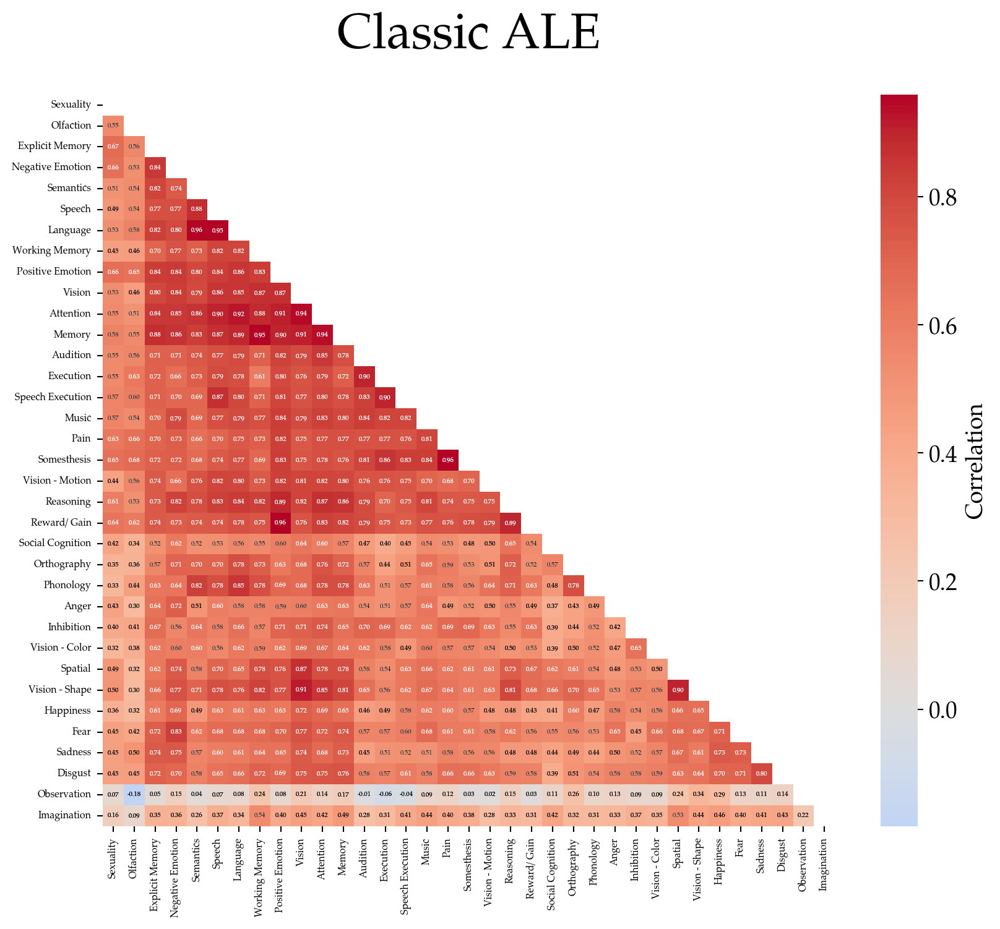

In [62]:
# Initialize the cross-correlation DataFrame
cross_corr = pd.DataFrame(dtype=float)

# Calculate the correlation matrix
for i, m_i in enumerate(ALE_surf_zmaps.keys()):
    for j, m_j in enumerate(ALE_surf_zmaps.keys()):
        cross_corr.loc[m_i, m_j] = scipy.stats.pearsonr(ALE_surf_zmaps[m_i], ALE_surf_zmaps[m_j]).statistic

# Perform hierarchical clustering
distance_matrix = 1 - cross_corr  # Convert correlation to distance
linkage_matrix = sch.linkage(distance_matrix, method='average')

# Create a dendrogram to get the order of the leaves
dendro = sch.dendrogram(linkage_matrix, labels=cross_corr.index, no_plot=True)
ordered_leaves = dendro['ivl']

# Reorder the correlation matrix
ordered_cross_corr = cross_corr.loc[ordered_leaves, ordered_leaves]

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(ordered_cross_corr, dtype=bool))

# Set diagonal to beige and hide the annotation for the diagonal
for i in range(len(ordered_cross_corr)):
    ordered_cross_corr.iat[i, i] = np.nan  # Hide the correlation coefficient for the diagonal


# Replace subdomain labels with nicer labels
ordered_cross_corr.columns = [subdomain_labels[label] for label in ordered_cross_corr.columns]
ordered_cross_corr.index = [subdomain_labels[label] for label in ordered_cross_corr.index]

# Plot the reordered correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
ax = sns.heatmap(
    ordered_cross_corr, 
    annot=True, 
    fmt=".2f", 
    cmap='coolwarm', 
    cbar_kws={'label': 'Correlation'}, 
    annot_kws={"fontsize": 4},  # Adjust the font size of the annotations
    center=0.0,  # Center the colormap at 0.0
    mask=mask,  # Mask the upper triangle
    square=True  # Keep the cells square-shaped
)


# Add text annotations with color based on the correlation value
for i in range(ordered_cross_corr.shape[0]):
    for j in range(ordered_cross_corr.shape[1]):
        if i > j:  # Annotate only the lower triangle
            text = f'{ordered_cross_corr.iloc[i, j]:.2f}'
            color = 'white' if ordered_cross_corr.iloc[i, j] > 0.6 else 'black'
            ax.text(j + 0.5, i + 0.5, text, horizontalalignment='center', verticalalignment='center', c=color, size=4)

# Explicitly set the ticks and labels on the heatmap axes
ax.set_xticks(np.arange(len(ordered_cross_corr.columns)) + 0.5)
ax.set_yticks(np.arange(len(ordered_cross_corr.index)) + 0.5)
ax.set_xticklabels(ordered_cross_corr.columns, size=6, rotation=90)
ax.set_yticklabels(ordered_cross_corr.index, size=6)

# Plot title
plt.title('Classic ALE', y = 1.05, fontsize = 30)

# Save figure
ax.figure.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure1/Supplementary/ALE_subd-spatialCorrelation.png'), bbox_inches='tight')


plt.show()

# C-SALE

In [125]:
# Define the subdomain names as a list. These come directly from BrainMap.
subdomains_list = ['Execution', 'Execution.Speech', 'Imagination', 'Inhibition', 'MotorLearning', 'Observation', 'Preparation', 'Attention', 'Language', 'Language.Orthography', 'Language.Phonology', 'Language.Semantics', 'Language.Speech', 'Language.Syntax','Memory', 'Memory.Explicit', 'Memory.Working','Music', 'Reasoning', 'SocialCognition', 'Spatial', 'Temporal', 'Negative', 'Negative.Anger', 'Negative.Anxiety', 'Negative.Disgust', 'Negative.Fear', 'Negative.Sadness', 'Positive', 'Positive.Happiness', 'Positive.RewardGain', 'Valence', 'Hunger', 'RespirationRegulation', 'Sexuality', 'Audition', 'Gustation', 'Olfaction', 'Somesthesis', 'Somesthesis.Pain','Vision', 'Vision.Color','Vision.Motion', 'Vision.Shape']
MASK_NAME = 'D2009_MNI'
mask_img = os.path.join(INPUT_DIR, f'maps/{MASK_NAME}.nii.gz')
k = 50

# Initialize dictionaries to store results
SALE_zmaps = {}
SALE_surf_zmaps = {}
SALE_zmaps_thr_strict = {}
SALE_surf_zmaps_thr_strict = {}

all_subdomains = []  # Initialize an empty list to store all subdomains

for domain in domains:
    domain_path = os.path.join(OUTPUT_DIR, 'SALE', f'{domain}')
    all_domains = os.listdir(domain_path)
    
    # Exclude subdomains with the same name as the domains
    subdomains = [subdomain for subdomain in all_domains if subdomain not in domains]
    all_subdomains.extend(subdomains)  # Add the subdomains to the list
    
    for subdomain in subdomains:
        subdomain_path = os.path.join(domain_path, subdomain)
        if not os.path.isdir(subdomain_path):
            continue
        print(subdomain)
        
        # Load uncorrected results
        z_orig = nibabel.load(os.path.join(subdomain_path, 'uncorr_z.nii.gz'))
        
        # Mask to the proper mask
        z_masked = nilearn.image.math_img("m * img", img=z_orig, m=mask_img)
        
        # Record 3D and flattened unthresholded images
        SALE_zmaps[subdomain] = z_masked
        SALE_surf_zmaps[subdomain] = SUITPy.flatmap.vol_to_surf(SALE_zmaps[subdomain], space='SPM').squeeze()
        
        # Define path for corrected cluster result (strict)
        corr_cluster_z_path_strict = os.path.join(subdomain_path, f'corr_cluster_h-001_k-50_mask-D2009_MNI_z.nii.gz')
        
        # Check if the file exists
        if os.path.exists(corr_cluster_z_path_strict):
            # Record 3D and flattened thresholded (p < .001 and k = 50) images
            SALE_zmaps_thr_strict[subdomain] = nibabel.load(corr_cluster_z_path_strict)
            SALE_surf_zmaps_thr_strict[subdomain] = SUITPy.flatmap.vol_to_surf(SALE_zmaps_thr_strict[subdomain], space='SPM').squeeze()
        else:
            print(f"Corrected cluster result not found for subdomain: {subdomain}")

Action.Imagination
Action.Execution
Action.Observation
Action.Inhibition
Action.Execution.Speech
Cognition.Language
Cognition.Memory
Cognition.Attention
Cognition.Language.Speech
Cognition.Language.Semantics
Cognition.Language.Phonology
Cognition.SocialCognition
Cognition.Reasoning
Cognition.Spatial
Cognition.Language.Orthography
Cognition.Memory.Explicit
Cognition.Music
Cognition.Memory.Working
Emotion.Positive.Happiness
Emotion.Negative.Sadness
Emotion.Negative.Fear
Emotion.Positive
Emotion.Negative.Disgust
Emotion.Positive.RewardGain
Emotion.Negative.Anger
Emotion.Negative
Interoception.Sexuality
Perception.Somesthesis.Pain
Perception.Olfaction
Perception.Vision
Perception.Audition
Perception.Vision.Motion
Perception.Somesthesis
Perception.Vision.Color
Perception.Vision.Shape


/tmp/ipykernel_2252302/3378000836.py:11: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage_matrix = sch.linkage(distance_matrix, method='average')


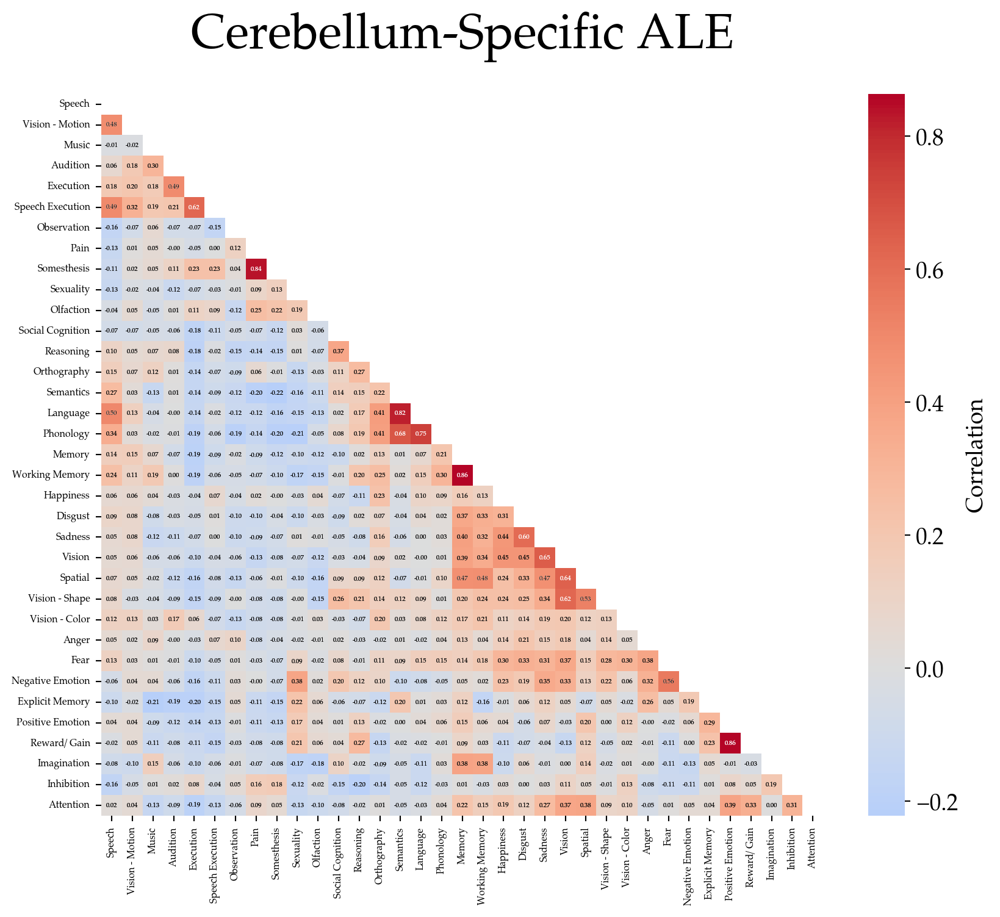

In [126]:
# Initialize the cross-correlation DataFrame
cross_corr = pd.DataFrame(dtype=float)

# Calculate the correlation matrix
for i, m_i in enumerate(SALE_surf_zmaps.keys()):
    for j, m_j in enumerate(SALE_surf_zmaps.keys()):
        cross_corr.loc[m_i, m_j] = scipy.stats.pearsonr(SALE_surf_zmaps[m_i], SALE_surf_zmaps[m_j]).statistic

# Perform hierarchical clustering
distance_matrix = 1 - cross_corr  # Convert correlation to distance
linkage_matrix = sch.linkage(distance_matrix, method='average')

# Create a dendrogram to get the order of the leaves
dendro = sch.dendrogram(linkage_matrix, labels=cross_corr.index, no_plot=True)
ordered_leaves = dendro['ivl']

# Reorder the correlation matrix
ordered_cross_corr = cross_corr.loc[ordered_leaves, ordered_leaves]

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(ordered_cross_corr, dtype=bool))

# Set diagonal to beige and hide the annotation for the diagonal
for i in range(len(ordered_cross_corr)):
    ordered_cross_corr.iat[i, i] = np.nan  # Hide the correlation coefficient for the diagonal


# Replace subdomain labels with nicer labels
ordered_cross_corr.columns = [subdomain_labels[label] for label in ordered_cross_corr.columns]
ordered_cross_corr.index = [subdomain_labels[label] for label in ordered_cross_corr.index]

# Plot the reordered correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
ax = sns.heatmap(
    ordered_cross_corr, 
    annot=True, 
    fmt=".2f", 
    cmap='coolwarm', 
    cbar_kws={'label': 'Correlation'}, 
    annot_kws={"fontsize": 4},  # Adjust the font size of the annotations
    center=0.0,  # Center the colormap at 0.0
    mask=mask,  # Mask the upper triangle
    square=True  # Keep the cells square-shaped
)


# Add text annotations with color based on the correlation value
for i in range(ordered_cross_corr.shape[0]):
    for j in range(ordered_cross_corr.shape[1]):
        if i > j:  # Annotate only the lower triangle
            text = f'{ordered_cross_corr.iloc[i, j]:.2f}'
            color = 'white' if ordered_cross_corr.iloc[i, j] > 0.6 else 'black'
            ax.text(j + 0.5, i + 0.5, text, horizontalalignment='center', verticalalignment='center', c=color, size=4)

# Explicitly set the ticks and labels on the heatmap axes
ax.set_xticks(np.arange(len(ordered_cross_corr.columns)) + 0.5)
ax.set_yticks(np.arange(len(ordered_cross_corr.index)) + 0.5)
ax.set_xticklabels(ordered_cross_corr.columns, size=6, rotation=90)
ax.set_yticklabels(ordered_cross_corr.index, size=6)


plt.title('Cerebellum-Specific ALE', y = 1.05, fontsize = 30)

# Save figure
ax.figure.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure1/Supplementary/SALE_subd-spatialCorrelation.png'), bbox_inches='tight')


plt.show()

# Figure 1e, f (correlation distributions for subdomains)

In [127]:
# Calculate correlation matrices for ALE, dSALE, and pSALE
def calculate_correlation_matrix(surf_zmaps, dict_name=""):
    cross_corr = pd.DataFrame(dtype=float)
    for i, m_i in enumerate(surf_zmaps.keys()):
        for j, m_j in enumerate(surf_zmaps.keys()):
            cross_corr.loc[m_i, m_j] = scipy.stats.pearsonr(surf_zmaps[m_i], surf_zmaps[m_j]).statistic
    
    # Extract the upper triangle of the correlation matrix (excluding diagonal)
    upper_triangle_corrs = cross_corr.where(np.triu(np.ones(cross_corr.shape), k=1).astype(bool)).stack()
    
    # Calculate the median correlation coefficient
    median_corr = upper_triangle_corrs.median()
    
    # Print the median correlation coefficient with the dictionary name
    print(f"Median correlation coefficient for '{dict_name}': {median_corr:.4f}")
    
    return cross_corr


In [128]:
# Function to extract lower triangle values from a correlation matrix
def extract_lower_triangle(corr_matrix):
    lower_triangle_values = []
    for i in range(len(corr_matrix)):
        for j in range(i):
            lower_triangle_values.append(corr_matrix.iat[i, j])
    return lower_triangle_values

In [129]:
# Function to plot and save individual histograms
def plot_and_save_histogram(values, title, color, save_path):
    plt.figure(figsize=(6, 4))
    sns.histplot(values, bins=20, kde=True, color=color)
    plt.title(title, fontsize=18, x = 0.4, y=1.02)
    plt.xlabel('Correlation Coefficient', fontsize = 14)
    plt.ylabel('Frequency', fontsize = 14)
    plt.tight_layout()
    plt.savefig(save_path, bbox_inches='tight')
    plt.close()

Median correlation coefficient for 'ALE': 0.6328
Median correlation coefficient for 'SALE': 0.0110


/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/data/project/cerebellum_ale/venv/lib/python3.11/sit

Median correlation coefficient for 'ALE - Thresholded': 0.3952


/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/data/project/cerebellum_ale/venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/data/project/cerebellum_ale/venv/lib/python3.11/sit

Median correlation coefficient for 'SALE - Thresholded': -0.0051


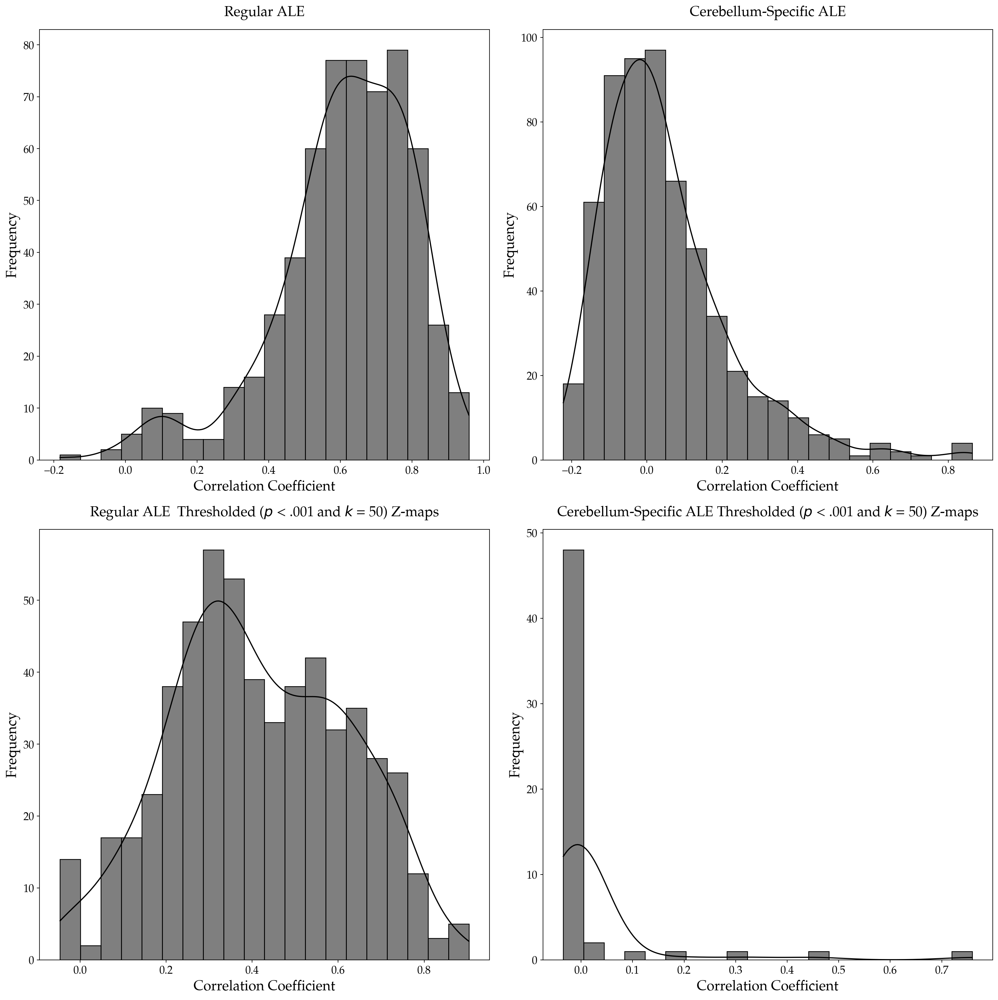

In [131]:
# Assuming ALE_surf_zmaps, pSALE_surf_zmaps are defined (these are the unthresholded z-maps for ALE/ C-SALE).
cross_corr_ALE = calculate_correlation_matrix(ALE_surf_zmaps, dict_name='ALE')
cross_corr_SALE = calculate_correlation_matrix(SALE_surf_zmaps, dict_name='SALE')

# Extract lower triangle values, we discard the upper triangle and diagonal.
ale_values = extract_lower_triangle(cross_corr_ALE)
sale_values = extract_lower_triangle(cross_corr_SALE)

# Create correlations and extract lower triangle values for thresholded z-maps
## Note that thresholded maps should barely correlate at all.
cross_corr_ALE_thr = calculate_correlation_matrix(ALE_surf_zmaps_thr_strict, dict_name = 'ALE - Thresholded')
cross_corr_SALE_thr = calculate_correlation_matrix(SALE_surf_zmaps_thr_strict, dict_name = 'SALE - Thresholded')

ale_values_thr = extract_lower_triangle(cross_corr_ALE_thr)
sale_values_thr = extract_lower_triangle(cross_corr_SALE_thr)

# Prepare data for plotting
values_list = [ale_values, sale_values, ale_values_thr, sale_values_thr]

titles = [
    'Regular ALE',
    'Cerebellum-Specific ALE',
    'Regular ALE  Thresholded ($\mathit{p}$ < .001 and $\mathit{k}$ = 50) Z-maps',
    'Cerebellum-Specific ALE Thresholded ($\mathit{p}$ < .001 and $\mathit{k}$ = 50) Z-maps'
]


colors = ['black','black','black','black']

save_paths = [
    os.path.join(BASE_DIR, 'Figures/Publication/Figure1/1e_ALE_subd_corr-distribution.png'),
    os.path.join(BASE_DIR, 'Figures/Publication/Figure1/1f_SALE_subd_corr-distribution.png'),
    os.path.join(BASE_DIR, 'Figures/Publication/Figure1/Supplementary/ALE_subd_corr-distribution-thres.png'),
    os.path.join(BASE_DIR, 'Figures/Publication/Figure1/Supplementary/SALE_subd_corr-distribution-thres.png')
]

# Plot and save each histogram individually
for values, title, color, save_path in zip(values_list, titles, colors, save_paths):
    plot_and_save_histogram(values, title, color, save_path)

# Create a combined figure with all four histograms in a 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(18, 18))

for i, (values, title, color) in enumerate(zip(values_list, titles, colors)):
    ax = axes[i // 2, i % 2]
    sns.histplot(values, bins=20, kde=True, color=color, ax=ax)
    ax.set_title(title, fontsize=18, y=1.02)
    ax.set_xlabel('Correlation Coefficient', fontsize = 18)
    ax.set_ylabel('Frequency', fontsize = 18)

plt.tight_layout()

# Save the common figure
plt.savefig(os.path.join(BASE_DIR, 'Figures/Publication/Figure1/Supplementary/ALE-SALE_corr-distribution_unthres-thres.png'), bbox_inches='tight')
plt.show()



# The End